<a href="https://colab.research.google.com/github/joannameilin/Astron100-Final-Project/blob/main/Astron100_Final_Project_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Start-up Steps**
- Importing all libraries
- Connecting Google Drive and creating file pathways for access
- Run all cells below before using either imaging reduction pipeline or spectroscopic reduction pipeline!

In [2]:
#importing all libraries needed

import numpy as np
import math
import matplotlib.pyplot as plt
import os
from os import listdir
from scipy.ndimage import shift
import glob
import warnings
warnings.filterwarnings("ignore")
from matplotlib.gridspec import GridSpec
from scipy.optimize import curve_fit
from scipy.signal import find_peaks, peak_widths
from scipy.stats import norm
from scipy.ndimage import gaussian_filter1d
from numpy.polynomial import Polynomial

# astropy imports
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.visualization import ZScaleInterval, ImageNormalize, PercentileInterval, AsinhStretch
from astropy.wcs import WCS
from astropy.wcs.utils import add_stokes_axis_to_wcs

In [3]:
# mounting google drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import os

Mounted at /content/drive


In [4]:
#connecting Google Drive Folder w. all necessary data, creating lists to flat, bias, and raw science files

# establishing directory
dir = 'drive/MyDrive/Astron100_Final_Project_Data'

# establishing directories to bias, flat, science folders
bias_kepler_list = glob.glob(dir+"/bias_kepler/*.fits")
bias_fast_list = glob.glob(dir+"/bias_fast/*.fits")
flat_kepler_list = glob.glob(dir+"/flat_kepler/*.fits")
flat_fast_list = glob.glob(dir+"/flat_fast/*.fits")
#science_fast_dir = dir+"fast_science_images/"
#science_kepler_dir = dir+"kepler_science_images/"

science_kepler_list = glob.glob(dir+"/kepler_science_images/*.fits")
science_fast_list = glob.glob(dir+"/fast_science_images/*.fits")

# printing lists (to ensure proper connection to folders)
print(bias_kepler_list)
print(bias_fast_list)
print(flat_kepler_list)
print(flat_fast_list)
print(science_kepler_list)
print(science_fast_list)

['drive/MyDrive/Astron100_Final_Project_Data/bias_kepler/Copy of 0004.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_kepler/Copy of 0003.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_kepler/Copy of 0002.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_kepler/Copy of 0164.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_kepler/Copy of 0160.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_kepler/Copy of 0161.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_kepler/Copy of 0166.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_kepler/Copy of 0224.BIAS.fits']
['drive/MyDrive/Astron100_Final_Project_Data/bias_fast/Copy of 0009.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_fast/Copy of 0001.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_fast/Copy of 0002.BIAS.fits', 'drive/MyDrive/Astron100_Final_Project_Data/bias_fast/Copy of 0006.BIAS.fits', 'drive/MyDrive/Astron100_Final_Pro

## **Master Lists for KeplerCam Data (Bias & Flats in All Filters)**
- Master median lists for KeplerCam bias and flat frames. Separated by each quadrant in the fits file: number 1 = quadrant 1; number 2 = quadrant 2, etc.
- Flat master lists are separated by filters (g, r, z, i, V, and B)
- Run all cells below!

In [5]:
#creating master lists for Kepler bias data
#KB: Kepler Bias
KBdata_array_full_1 = []
KBdata_array_full_2 = []
KBdata_array_full_3 = []
KBdata_array_full_4 = []

for i,fn in enumerate(bias_kepler_list[:20]):
  KBdata1 = fits.getdata(fn, 1)
  KBdata_array_full_1.append(KBdata1[None]) #None gives a dummy axis, wants to concatenate along the dummy axis

  KBdata2 = fits.getdata(fn, 2)
  KBdata_array_full_2.append(KBdata2[None])

  KBdata3 = fits.getdata(fn, 3)
  KBdata_array_full_3.append(KBdata3[None])

  KBdata4 = fits.getdata(fn, 4)
  KBdata_array_full_4.append(KBdata4[None])

KBdata_array_full_1 = np.concatenate(KBdata_array_full_1, axis = 0)
KBmaster_bias_1 = np.median(KBdata_array_full_1, axis = 0)

KBdata_array_full_2 = np.concatenate(KBdata_array_full_2, axis = 0)
KBmaster_bias_2 = np.median(KBdata_array_full_2, axis = 0)

KBdata_array_full_3 = np.concatenate(KBdata_array_full_3, axis = 0)
KBmaster_bias_3 = np.median(KBdata_array_full_3, axis = 0)

KBdata_array_full_4 = np.concatenate(KBdata_array_full_4, axis = 0)
KBmaster_bias_4 = np.median(KBdata_array_full_4, axis = 0)

#print shapes of the master biases
print(KBmaster_bias_1.shape)
print(KBmaster_bias_2.shape)
print(KBmaster_bias_3.shape)
print(KBmaster_bias_4.shape)

(1025, 1040)
(1025, 1040)
(1025, 1040)
(1025, 1040)


In [6]:
#creating master lists for Kepler flats data, r filter
#KFR: Kepler flats r filter

KFRdata_array_full_1f = []
KFRdata_array_full_2f = []
KFRdata_array_full_3f = []
KFRdata_array_full_4f = []

for i,fn in enumerate(flat_kepler_list[:20]):
    if fits.getheader(fn)['FILTER'] != 'r':
      continue
    KFRdata1f = fits.getdata(fn, 1)
    KFRdata_array_full_1f.append(KFRdata1f[None]) #None gives a dummy axis, wants to concatenate along the dummy axis

    KFRdata2f = fits.getdata(fn, 2)
    KFRdata_array_full_2f.append(KFRdata2f[None])

    KFRdata3f = fits.getdata(fn, 3)
    KFRdata_array_full_3f.append(KFRdata3f[None])

    KFRdata4f = fits.getdata(fn, 4)
    KFRdata_array_full_4f.append(KFRdata4f[None])

KFRdata_array_full_1f = np.concatenate(KFRdata_array_full_1f, axis = 0)
KFRmaster_flats_1 = np.median(KFRdata_array_full_1f, axis = 0)

KFRdata_array_full_2f = np.concatenate(KFRdata_array_full_2f, axis = 0)
KFRmaster_flats_2 = np.median(KFRdata_array_full_2f, axis = 0)

KFRdata_array_full_3f = np.concatenate(KFRdata_array_full_3f, axis = 0)
KFRmaster_flats_3 = np.median(KFRdata_array_full_3f, axis = 0)

KFRdata_array_full_4f = np.concatenate(KFRdata_array_full_4f, axis = 0)
KFRmaster_flats_4 = np.median(KFRdata_array_full_4f, axis = 0)

#print shapes of the master biases
print(KFRmaster_flats_1.shape)
print(KFRmaster_flats_2.shape)
print(KFRmaster_flats_3.shape)
print(KFRmaster_flats_4.shape)

(1025, 1040)
(1025, 1040)
(1025, 1040)
(1025, 1040)


In [7]:
#creating master lists for flats data, specifically in the V band
# KFV - kepler flat v band
KFVdata_array_full_1f = []
KFVdata_array_full_2f = []
KFVdata_array_full_3f = []
KFVdata_array_full_4f = []


for i,fn in enumerate(glob.glob('drive/MyDrive/Astron100_Final_Project_Data/flat_kepler/*FLATV*fits')):

    KFVdata1f = fits.getdata(fn, 1)
    KFVdata_array_full_1f.append(KFVdata1f[None]) #None gives a dummy axis, wants to concatenate along the dummy axis

    KFVdata2f = fits.getdata(fn, 2)
    KFVdata_array_full_2f.append(KFVdata2f[None])

    KFVdata3f = fits.getdata(fn, 3)
    KFVdata_array_full_3f.append(KFVdata3f[None])

    KFVdata4f = fits.getdata(fn, 4)
    KFVdata_array_full_4f.append(KFVdata4f[None])


KFVdata_array_full_1f = np.concatenate(KFVdata_array_full_1f, axis = 0)
KFVmaster_flats_1 = np.median(KFVdata_array_full_1f, axis = 0)

KFVdata_array_full_2f = np.concatenate(KFVdata_array_full_2f, axis = 0)
KFVmaster_flats_2 = np.median(KFVdata_array_full_2f, axis = 0)

KFVdata_array_full_3f = np.concatenate(KFVdata_array_full_3f, axis = 0)
KFVmaster_flats_3 = np.median(KFVdata_array_full_3f, axis = 0)

KFVdata_array_full_4f = np.concatenate(KFVdata_array_full_4f, axis = 0)
KFVmaster_flats_4 = np.median(KFVdata_array_full_4f, axis = 0)

#print shapes of the master biases
print(KFVmaster_flats_1.shape)
print(KFVmaster_flats_2.shape)
print(KFVmaster_flats_3.shape)
print(KFVmaster_flats_4.shape)

(1025, 1040)
(1025, 1040)
(1025, 1040)
(1025, 1040)


In [8]:
#creating master lists for flats data, specifically in the B band
# KFB - kepler flat B band
KFBdata_array_full_1f = []
KFBdata_array_full_2f = []
KFBdata_array_full_3f = []
KFBdata_array_full_4f = []


for i,fn in enumerate(glob.glob('drive/MyDrive/Astron100_Final_Project_Data/flat_kepler/*FLATB*fits')):

    KFBdata1f = fits.getdata(fn, 1)
    KFBdata_array_full_1f.append(KFBdata1f[None]) #None gives a dummy axis, wants to concatenate along the dummy axis

    KFBdata2f = fits.getdata(fn, 2)
    KFBdata_array_full_2f.append(KFBdata2f[None])

    KFBdata3f = fits.getdata(fn, 3)
    KFBdata_array_full_3f.append(KFBdata3f[None])

    KFBdata4f = fits.getdata(fn, 4)
    KFBdata_array_full_4f.append(KFBdata4f[None])


KFBdata_array_full_1f = np.concatenate(KFBdata_array_full_1f, axis = 0)
KFBmaster_flats_1 = np.median(KFBdata_array_full_1f, axis = 0)

KFBdata_array_full_2f = np.concatenate(KFBdata_array_full_2f, axis = 0)
KFBmaster_flats_2 = np.median(KFBdata_array_full_2f, axis = 0)

KFBdata_array_full_3f = np.concatenate(KFBdata_array_full_3f, axis = 0)
KFBmaster_flats_3 = np.median(KFBdata_array_full_3f, axis = 0)

KFBdata_array_full_4f = np.concatenate(KFBdata_array_full_4f, axis = 0)
KFBmaster_flats_4 = np.median(KFBdata_array_full_4f, axis = 0)

#print shapes of the master biases
print(KFBmaster_flats_1.shape)
print(KFBmaster_flats_2.shape)
print(KFBmaster_flats_3.shape)
print(KFBmaster_flats_4.shape)

(1025, 1040)
(1025, 1040)
(1025, 1040)
(1025, 1040)


In [9]:
#creating master lists for flats data, specifically in the g filter
# KFG - kepler flat g filter
KFGdata_array_full_1f = []
KFGdata_array_full_2f = []
KFGdata_array_full_3f = []
KFGdata_array_full_4f = []


for i,fn in enumerate(flat_kepler_list[:20]):
    if fits.getheader(fn)['FILTER'] != 'g':
      continue

    KFGdata1f = fits.getdata(fn, 1)
    KFGdata_array_full_1f.append(KFGdata1f[None]) #None gives a dummy axis, wants to concatenate along the dummy axis

    KFGdata2f = fits.getdata(fn, 2)
    KFGdata_array_full_2f.append(KFGdata2f[None])

    KFGdata3f = fits.getdata(fn, 3)
    KFGdata_array_full_3f.append(KFGdata3f[None])

    KFGdata4f = fits.getdata(fn, 4)
    KFGdata_array_full_4f.append(KFGdata4f[None])


KFGdata_array_full_1f = np.concatenate(KFGdata_array_full_1f, axis = 0)
KFGmaster_flats_1 = np.median(KFGdata_array_full_1f, axis = 0)

KFGdata_array_full_2f = np.concatenate(KFGdata_array_full_2f, axis = 0)
KFGmaster_flats_2 = np.median(KFGdata_array_full_2f, axis = 0)

KFGdata_array_full_3f = np.concatenate(KFGdata_array_full_3f, axis = 0)
KFGmaster_flats_3 = np.median(KFGdata_array_full_3f, axis = 0)

KFGdata_array_full_4f = np.concatenate(KFGdata_array_full_4f, axis = 0)
KFGmaster_flats_4 = np.median(KFGdata_array_full_4f, axis = 0)

#print shapes of the master biases
print(KFGmaster_flats_1.shape)
print(KFGmaster_flats_2.shape)
print(KFGmaster_flats_3.shape)
print(KFGmaster_flats_4.shape)

(1025, 1040)
(1025, 1040)
(1025, 1040)
(1025, 1040)


In [10]:
#creating master lists for flats data, specifically in the i filter
# KFI - kepler flat i filter
KFIdata_array_full_1f = []
KFIdata_array_full_2f = []
KFIdata_array_full_3f = []
KFIdata_array_full_4f = []


for i,fn in enumerate(flat_kepler_list[:20]):
    if fits.getheader(fn)['FILTER'] != 'i':
      continue
    KFIdata1f = fits.getdata(fn, 1) - KBmaster_bias_1
    KFIdata_array_full_1f.append(KFIdata1f[None]) #None gives a dummy axis, wants to concatenate along the dummy axis

    KFIdata2f = fits.getdata(fn, 2) - KBmaster_bias_2
    KFIdata_array_full_2f.append(KFIdata2f[None])

    KFIdata3f = fits.getdata(fn, 3) - KBmaster_bias_3
    KFIdata_array_full_3f.append(KFIdata3f[None])

    KFIdata4f = fits.getdata(fn, 4) - KBmaster_bias_4
    KFIdata_array_full_4f.append(KFIdata4f[None])


KFIdata_array_full_1f = np.concatenate(KFIdata_array_full_1f, axis = 0)
KFImaster_flats_1 = np.median(KFIdata_array_full_1f, axis = 0)

KFIdata_array_full_2f = np.concatenate(KFIdata_array_full_2f, axis = 0)
KFImaster_flats_2 = np.median(KFIdata_array_full_2f, axis = 0)

KFIdata_array_full_3f = np.concatenate(KFIdata_array_full_3f, axis = 0)
KFImaster_flats_3 = np.median(KFIdata_array_full_3f, axis = 0)

KFIdata_array_full_4f = np.concatenate(KFIdata_array_full_4f, axis = 0)
KFImaster_flats_4 = np.median(KFIdata_array_full_4f, axis = 0)

#print shapes of the master biases
print(KFImaster_flats_1.shape)
print(KFImaster_flats_2.shape)
print(KFImaster_flats_3.shape)
print(KFImaster_flats_4.shape)

(1025, 1040)
(1025, 1040)
(1025, 1040)
(1025, 1040)


In [11]:
#creating master lists for flats data, specifically in the z filter
# KFZ - kepler flat z filter
KFZdata_array_full_1f = []
KFZdata_array_full_2f = []
KFZdata_array_full_3f = []
KFZdata_array_full_4f = []


for i,fn in enumerate(flat_kepler_list[:20]):
    if fits.getheader(fn)['FILTER'] != 'z':
      continue
    KFZdata1f = fits.getdata(fn, 1)
    KFZdata_array_full_1f.append(KFZdata1f[None]) #None gives a dummy axis, wants to concatenate along the dummy axis

    KFZdata2f = fits.getdata(fn, 2)
    KFZdata_array_full_2f.append(KFZdata2f[None])

    KFZdata3f = fits.getdata(fn, 3)
    KFZdata_array_full_3f.append(KFZdata3f[None])

    KFZdata4f = fits.getdata(fn, 4)
    KFZdata_array_full_4f.append(KFZdata4f[None])


KFZdata_array_full_1f = np.concatenate(KFZdata_array_full_1f, axis = 0)
KFZmaster_flats_1 = np.median(KFZdata_array_full_1f, axis = 0)

KFZdata_array_full_2f = np.concatenate(KFZdata_array_full_2f, axis = 0)
KFZmaster_flats_2 = np.median(KFZdata_array_full_2f, axis = 0)

KFZdata_array_full_3f = np.concatenate(KFZdata_array_full_3f, axis = 0)
KFZmaster_flats_3 = np.median(KFZdata_array_full_3f, axis = 0)

KFZdata_array_full_4f = np.concatenate(KFZdata_array_full_4f, axis = 0)
KFZmaster_flats_4 = np.median(KFZdata_array_full_4f, axis = 0)

#print shapes of the master biases
print(KFZmaster_flats_1.shape)
print(KFZmaster_flats_2.shape)
print(KFZmaster_flats_3.shape)
print(KFZmaster_flats_4.shape)

(1025, 1040)
(1025, 1040)
(1025, 1040)
(1025, 1040)


## **Visualization Function Code**

For visualizing raw science, bias, and flat images
- To use: only change the variable "hdulist" by changing the directory to where the target file is located in your Google Drive
- Does not mosaic any processed images, only raw files from drive


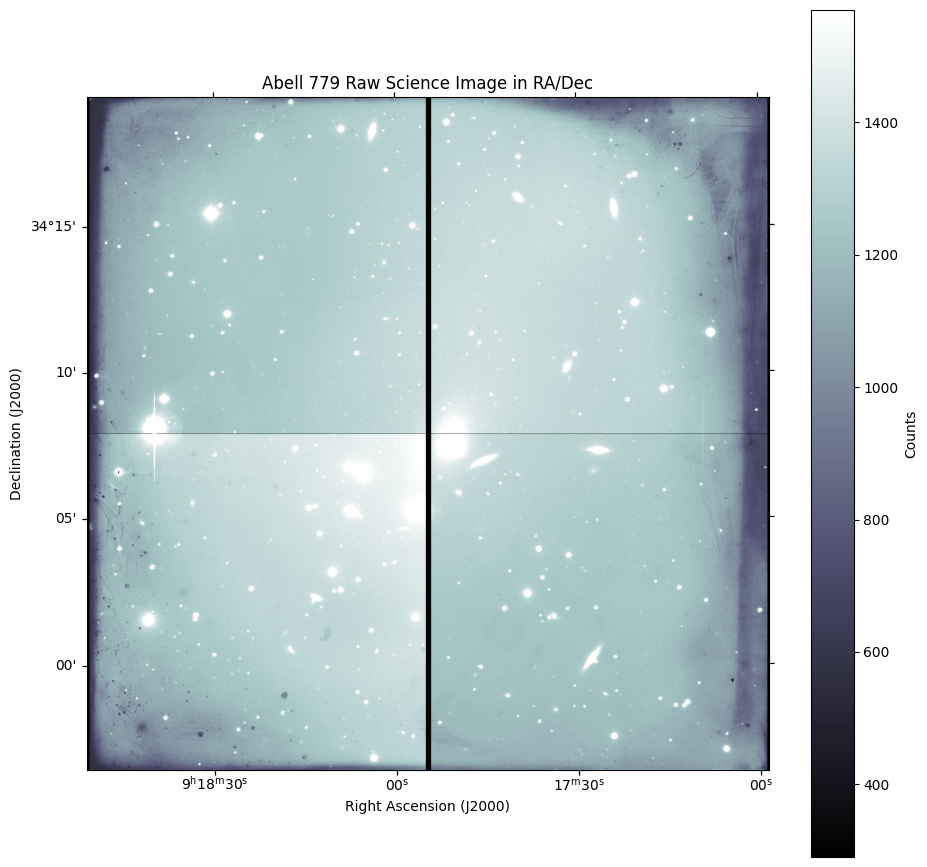

array([[264, 268, 260, ..., 276, 286, 274],
       [268, 267, 258, ..., 278, 283, 278],
       [268, 269, 258, ..., 275, 288, 283],
       ...,
       [258, 268, 261, ..., 269, 282, 268],
       [261, 269, 261, ..., 267, 283, 274],
       [258, 269, 262, ..., 289, 292, 291]], dtype=uint16)

In [12]:
# coding a visualization function - can be used to piece together and image raw science, flats, medians for KeplerCam

def mosaic_final(hdulist, position, show_plot=True):

  # extracting world coordinate system (WCS) from one of the science files fits header
  wcs = WCS(hdulist[1].header)

  # uploading quadrants
  quadrants = [hdulist[i].data for i in range(1, 5)]

  # defining dimensions
  height, width = quadrants[0].shape

  max_row = max(p[0] for p in position) + 1
  max_column = max(p[1] for p in position) + 1
  mosaic = np.zeros((max_row * height, max_column * width), dtype=quadrants[0].dtype)

  # placing quadrants in a mosaic
  for i, (row, col) in enumerate(position):
      mosaic[row * height:(row + 1) * height, col * width:(col + 1) * width] = quadrants[i]

  # adjusting the world coordinate system to mosaic scale; subtracting from crpix tells WCS how far the reference pixel has now been shifted
  # bc original quadrants are stitched together inside a bigger image
  wcs.wcs.crpix[0] -= width * position[0][1] # tells WCS how far right the first quadrant is
  wcs.wcs.crpix[1] -= height * position[0][0] # tells WCS how far down the first quadrant is

  # tells function how to plot when show_plot=True argument is given
  if show_plot:
    plt.figure(figsize=(11,11))
    norm = ImageNormalize(quadrants, interval=PercentileInterval(97.5))

    ax = plt.subplot(projection=wcs)
    im = ax.imshow(mosaic, cmap = "bone", norm=norm)

    ax.set_xlabel('Right Ascension (J2000)') # labeling axes
    ax.set_ylabel('Declination (J2000)')

    plt.title('Abell 779 Raw Science Image in RA/Dec')
    plt.colorbar(im, ax=ax, orientation='vertical', label='Counts')
    plt.show()

  return mosaic

#loading target fits file
hdulist = fits.open('drive/MyDrive/Astron100_Final_Project_Data/kepler_science_images/Copy of 0057.A779.fits') # file no. 0057 corresponds to the first item in the science_kepler_list list
 # some miscellaneous notes on some raw image files
 #0057 is (science_kepler_list[1])
 #0055 corresponds to science_kepler_list[3] and is out of focus
 #0059 has significant fringing (corresponds to science_kepler_list[0])

# orienting the quadrants
position = [(1,1),(1,0),(0,1),(0,0)]

# printing the final image
mosaic_final(hdulist, position, show_plot=True)


## **Reducing KeplerCam Data (g Filter)**

Reducing KeplerCam science images in the g filter and creating a final mosaic

**How to Use**
- Run first cell (with master flat and bias lists)
- Change the index number of science_kepler_list defined as the Q1g_kepler/Q2g_kepler/Q3g_kepler/Q4g_kepler variables and run all 4 quadrant processing blocks.
- Once all science_kepler_list indices are changed, the new processed files are automatically loaded into the visualization function and pieced together.

In [13]:
# master flat lists for all quadrants in g filter
quadrant1_g_flat = KFGmaster_flats_1
quadrant2_g_flat = KFGmaster_flats_2
quadrant3_g_flat = KFGmaster_flats_3
quadrant4_g_flat = KFGmaster_flats_4

# master bias lists for all quadrants in g filter
quadrant1_kepler_bias = KBmaster_bias_1
quadrant2_kepler_bias = KBmaster_bias_2
quadrant3_kepler_bias = KBmaster_bias_3
quadrant4_kepler_bias = KBmaster_bias_4

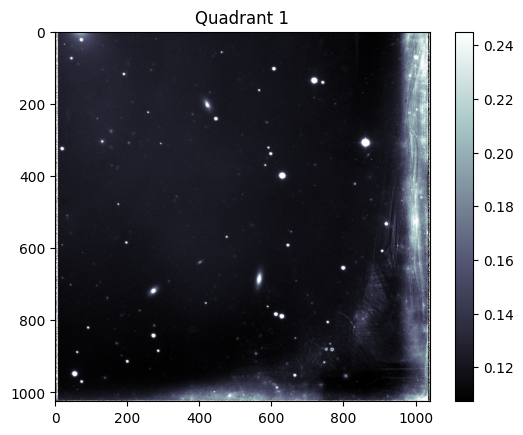

In [14]:
# processing quadrant 1

# bias corrected flat image
A1g_kepler = quadrant1_g_flat - quadrant1_kepler_bias

# reducing science image
Q1g_kepler = fits.getdata(science_kepler_list[1], 1)
I1g_kepler = (Q1g_kepler - quadrant1_kepler_bias)/A1g_kepler

# plotting quadrant 1, checking to see if bias and flats were removed properly.
norm = ImageNormalize(I1g_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 1')
plt.imshow(I1g_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()

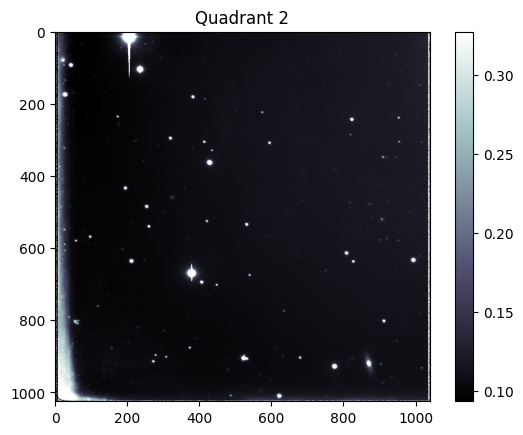

In [15]:
# processing quadrant 2

# bias corrected flat image
A2g_kepler = quadrant2_g_flat - quadrant2_kepler_bias

# reducing science image
Q2g_kepler = fits.getdata(science_kepler_list[1], 2)
I2g_kepler = (Q2g_kepler - quadrant2_kepler_bias)/A2g_kepler

# plotting quadrant 2, checking to see if bias and flats were removed properly.
norm = ImageNormalize(I2g_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 2')
plt.imshow(I2g_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()

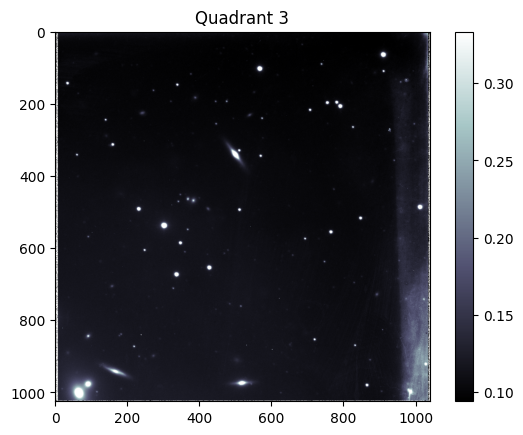

In [16]:
# processing quadrant 3

# bias corrected flat image
A3g_kepler = quadrant3_g_flat - quadrant3_kepler_bias

# reducing science image
Q3g_kepler = fits.getdata(science_kepler_list[1], 3)
I3g_kepler = (Q3g_kepler - quadrant3_kepler_bias)/A3g_kepler

# plotting quadrant 3, checking to see if bias and flats were removed properly.
norm = ImageNormalize(I3g_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 3')
plt.imshow(I3g_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()

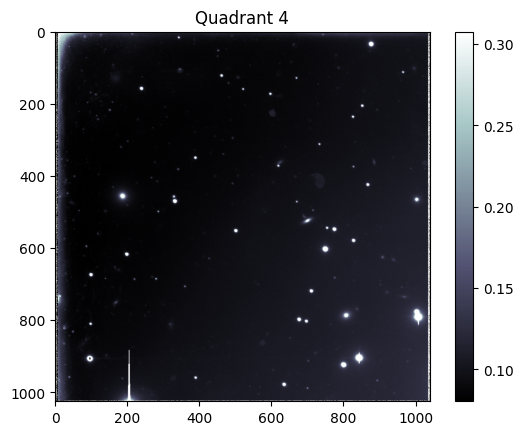

In [17]:
# processing quadrant 4

# bias corrected flat
A4g_kepler = quadrant4_g_flat - quadrant4_kepler_bias

# reducing science image
Q4g_kepler = fits.getdata(science_kepler_list[1], 4)
I4g_kepler = (Q4g_kepler - quadrant4_kepler_bias)/A4g_kepler

# plotting quadrant 4, checking to see if bias and flats were removed properly.
norm = ImageNormalize(I4g_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 4')
plt.imshow(I4g_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()

**How to Use Visualization Function**
- Change wcs_header_reference variable to match the science file actually being processed. This makes sure that you are mapping the image using the actual RA/Dec measurements of each file
- Everything else is ready to run!

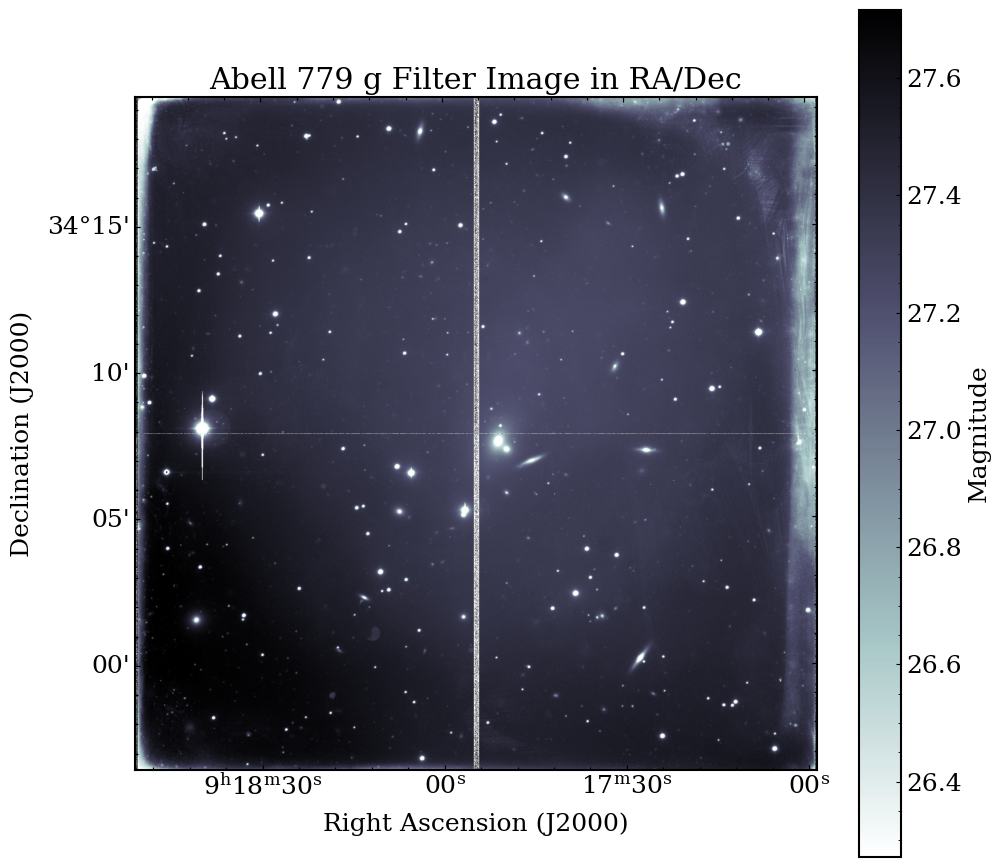

array([[26.74742501, 25.75257499, 50.        , ..., 50.        ,
        50.        , 50.        ],
       [25.        ,        -inf, 50.        , ..., 50.        ,
        50.        , 50.        ],
       [25.        , 24.75772497, 50.        , ..., 25.75257499,
        25.        , 24.55977185],
       ...,
       [23.80719686, 23.80719686, 50.        , ..., 25.        ,
        26.50514998, 24.24742501],
       [50.        , 25.36532009, 23.80719686, ..., 24.24742501,
        50.        , 50.        ],
       [50.        , 50.        ,        -inf, ..., 24.24742501,
        22.39651829, 23.58932142]])

In [18]:
# piecing together processed quadrants

# grabs the specific science file that will be used to extract RA and Dec information - make sure this variable
# is changed properly to the corresponding file being processed for accurate RA/Dec measurements
wcs_header_reference_g = fits.open('drive/MyDrive/Astron100_Final_Project_Data/kepler_science_images/Copy of 0057.A779.fits')

# defining function to convert to magnitude
def counts_to_magnitude(counts, zero_point):
    counts = np.clip(counts, 1e-10, None)  # clipping any non-positive values from counts
    return -2.5 * np.log10(counts) + zero_point

def mosaic_final_g(hdulist, position, show_plot=True):

  # extracting world coordinate system (WCS) from one of the science files fits header
  wcs = WCS(wcs_header_reference_g[1].header)

  # uploading the quadrants
  quadrants = [hdulist[i] for i in range(len(hdulist))]

  # converting to magnitude
  g_zero_point = 25.0 # zero point of SDSS g filter
  quadrants = [counts_to_magnitude(quadrants[i], g_zero_point) for i in range(len(quadrants))] # calling on zero point function to convert to magnitudes

  # defining dimensions
  height, width = quadrants[0].shape

  max_row = max(p[0] for p in position) + 1
  max_column = max(p[1] for p in position) + 1
  mosaic = np.zeros((max_row * height, max_column * width), dtype=quadrants[0].dtype)

  # placing quadrants in a mosaic
  for i, (row, col) in enumerate(position):
      mosaic[row * height:(row + 1) * height, col * width:(col + 1) * width] = quadrants[i]

  # adjusting the world coordinate system to mosaic scale; subtracting from crpix tells WCS how far the reference pixel has now been shifted
  # bc original quadrants are stitched together inside a bigger image
  wcs.wcs.crpix[0] -= width * position[0][1] # tells WCS how far right the first quadrant is
  wcs.wcs.crpix[1] -= height * position[0][0] # tells WCS how far down the first quadrant is

  # tells function how to plot when show_plot=True argument is given
  if show_plot:

    plt.rcParams['legend.frameon'] = True
    plt.rcParams['legend.fontsize'] = 14
    plt.rcParams['legend.borderpad'] = 0.3
    plt.rcParams['legend.labelspacing'] = 0.3
    plt.rcParams['legend.handletextpad'] = 0.3
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'DejaVu Serif'
    plt.rcParams['font.weight'] = 'light'
    plt.rcParams['font.size'] = 18
    plt.rcParams['xtick.top'] = True
    plt.rcParams['ytick.right'] = True
    plt.rcParams['ytick.minor.visible'] = True
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.rcParams['xtick.minor.visible'] = True
    plt.rcParams['xtick.minor.width'] = 2
    plt.rcParams["axes.linewidth"] = 1.5

    plt.figure(figsize=(11,11))
    norm = ImageNormalize(quadrants, interval=PercentileInterval(97.5))

    ax = plt.subplot(projection=wcs)
    im = ax.imshow(mosaic, cmap = "bone_r", norm=norm)

    ax.set_xlabel('Right Ascension (J2000)') # labeling axes
    ax.set_ylabel('Declination (J2000)')


    plt.title('Abell 779 g Filter Image in RA/Dec')
    plt.colorbar(im, ax=ax, orientation='vertical', label='Magnitude')
    plt.show()

  return mosaic

# now loading in processed quadrants as a list
hdulist_g = [I1g_kepler, I2g_kepler, I3g_kepler, I4g_kepler]

# orienting the quadrants
position = [(1,1),(1,0),(0,1),(0,0)]

# calling on function to create final image
mosaic_final_g(hdulist_g, position, show_plot=True)

# # ---------------
# # converting counts to magnitude!
# # ---------------

# g_zero_point = 25.0

# def counts_to_magnitude(counts, zero_point):
#     counts = np.clip(counts, 1e-10, None)  # Clip any non-positive values
#     return -2.5 * np.log10(counts) + zero_point

# g_mosaic = mosaic_final_g(hdulist_g, position, show_plot=False)
# g_mosaic = np.clip(g_mosaic, 1e-10, None)
# g_magnitude = counts_to_magnitude(g_mosaic, g_zero_point)
# # print(g_magnitude)

# # world coordinate system stuff
# # wcs = WCS(wcs_header_reference_g[1].header)
# # wcs.wcs.crpix[0] -= width * position[0][1] # tells WCS how far right the first quadrant is
# # wcs.wcs.crpix[1] -= height * position[0][0] # tells WCS how far down the first quadrant is


# plt.figure(figsize=(11,11))
# norm = ImageNormalize(g_magnitude, interval=PercentileInterval(97.5))
# ax = plt.subplot()
# im = ax.imshow(np.flipud(g_magnitude), cmap = "bone_r", norm=norm)
# plt.colorbar(im, ax=ax, orientation='vertical', label='Magnitude')
# plt.title('Abell 779 g Filter Image in RA/Dec')

In [19]:
fits.getheader('drive/MyDrive/Astron100_Final_Project_Data/kepler_science_images/Copy of 0057.A779.fits')

SIMPLE  =                    T / Primary FITS image array                       
BITPIX  =                   16                                                  
NAXIS   =                    0                                                  
EXTEND  =                    T / Fits standard                                  
OBJECT  = 'A779              ' / OBJECT NAME                                    
RA      = '09:19:46.85       ' / RA                                             
DEC     = '33:44:59.07       ' / DEC                                            
EPOCH   = '2000              ' / EPOCH                                          
AIR     = '1.00              ' / AIR MASS                                       
RRA     = '09:19:46.85       ' / RRA                                            
RDEC    = '33:44:59.07       ' / RDEC                                           
REPOCH  = '2000              ' / TEPOCH                                         
TRA     = '09:19:40.3       

## **Reducing KeplerCam Data (r filter)**

**How to Use**
- Change the index number of science_kepler_list defined as the Q1r_kepler/Q2r_kepler/Q3r_kepler/Q4r_kepler variables and run all 4 quadrant processing blocks.
- Once all science_kepler_list indices are changed, the new processed files are automatically loaded into the visualization function and pieced together.


In [20]:
# master flat lists for all quadrants
quadrant1_r_flat = KFRmaster_flats_1
quadrant2_r_flat = KFRmaster_flats_2
quadrant3_r_flat = KFRmaster_flats_3
quadrant4_r_flat = KFRmaster_flats_4

# master bias lists for all quadrants
quadrant1_kepler_bias = KBmaster_bias_1
quadrant2_kepler_bias = KBmaster_bias_2
quadrant3_kepler_bias = KBmaster_bias_3
quadrant4_kepler_bias = KBmaster_bias_4

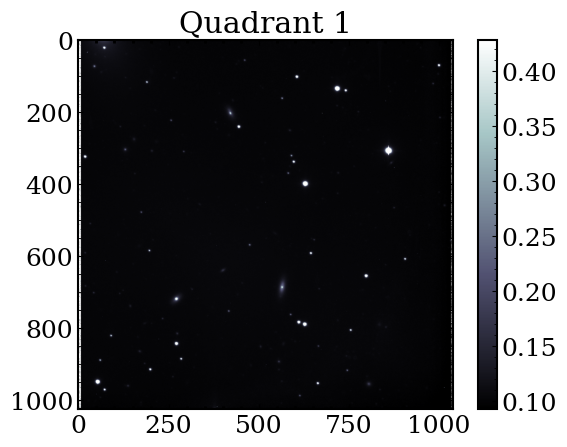

In [21]:
# procesing quadrant 1

# bias corrected flat image
A1_kepler_r = quadrant1_r_flat - quadrant1_kepler_bias

# reducing the science image in the red filter
Q1r_kepler = fits.getdata(science_kepler_list[1], 1)
I1r_kepler = (Q1r_kepler - quadrant1_kepler_bias)/A1_kepler_r

#plotting quadrant 1
norm = ImageNormalize(I1r_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 1')
plt.imshow(I1r_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()


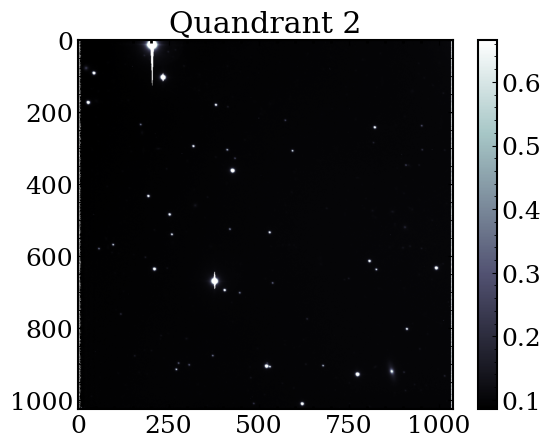

In [22]:
# processing quadrant 2

# bias corrected flat image
A2_kepler_r = quadrant2_r_flat - quadrant2_kepler_bias

# reducing science image in the red filter
Q2r_kepler = fits.getdata(science_kepler_list[1], 2)
I2r_kepler = (Q2r_kepler - quadrant2_kepler_bias)/A2_kepler_r

#plotting quadrant 2
norm = ImageNormalize(I2r_kepler, interval=PercentileInterval(97.5))
plt.title("Quandrant 2")
plt.imshow(I2r_kepler, norm=norm,
           cmap = "bone")
plt.colorbar()

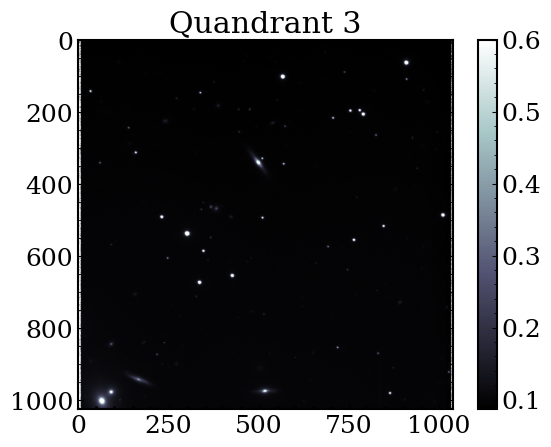

In [23]:
# processing quadrant 3

# bias corrected flat image
A3_kepler_r = quadrant3_r_flat - quadrant3_kepler_bias

# reduing science image in the red filter
Q3r_kepler = fits.getdata(science_kepler_list[1], 3)
I3r_kepler = (Q3r_kepler - quadrant3_kepler_bias)/A3_kepler_r

# plotting quadrant 3
norm = ImageNormalize(I3r_kepler, interval=PercentileInterval(97.5))
plt.title("Quandrant 3")
plt.imshow(I3r_kepler, norm=norm,
           cmap = "bone")
plt.colorbar()

(1025, 1040)


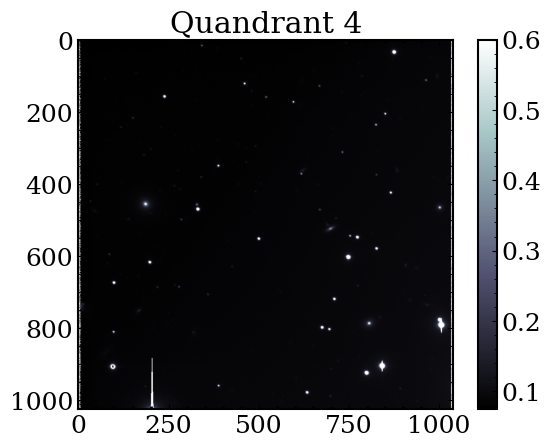

In [24]:
# processing quadrant 4

# bias corrected flat image
A4_kepler_r = quadrant4_r_flat - quadrant4_kepler_bias
print(A4_kepler_r.shape)

# reducing science image in the red filter
Q4r_kepler = fits.getdata(science_kepler_list[1], 4)
I4r_kepler = (Q4r_kepler - quadrant4_kepler_bias)/A4_kepler_r

# plotting quadrant 4
norm = ImageNormalize(I4r_kepler, interval=PercentileInterval(97.5))
plt.title("Quandrant 4")
plt.imshow(I4r_kepler, norm=norm,
           cmap = "bone")
plt.colorbar()

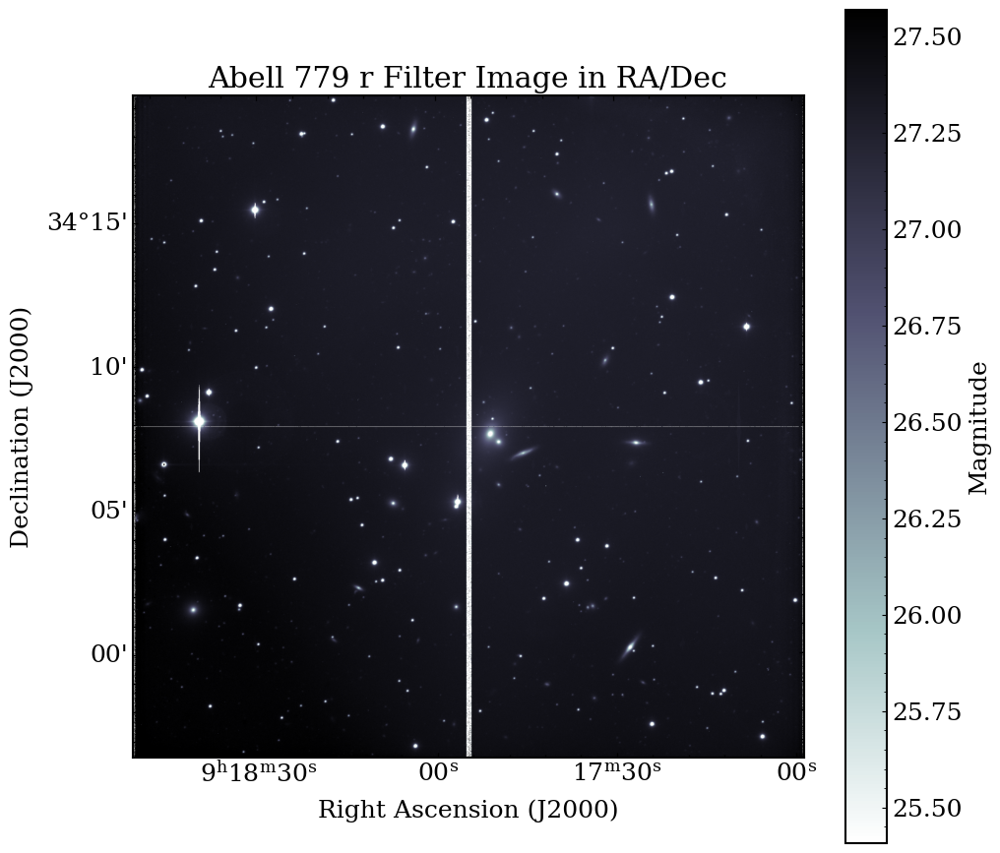

array([[26.16017011, 24.8       , 24.43467991, ..., 49.8       ,
        49.8       , 49.8       ],
       [25.07286117, 25.55257499, 24.8       , ..., 24.19240488,
        49.8       , 49.8       ],
       [25.07286117, 24.55772497, 24.8       , ..., 24.48765316,
        24.48765316, 25.11234684],
       ...,
       [25.35462187, 24.8       , 23.16696872, ..., 25.55257499,
        25.99280314, 49.8       ],
       [49.8       , 24.8       , 23.60719686, ..., 49.8       ,
        49.8       , 49.8       ],
       [25.99280314, 24.8       , 24.04742501, ..., 24.04742501,
        23.70166827, 24.30926339]])

In [25]:
# piecing together processed quadrants

# grabs the specific science file that will be used to extract RA and Dec information - make sure this variable
# is changed properly to the corresponding file being processed for accurate RA/Dec measurements
wcs_header_reference_r = fits.open('drive/MyDrive/Astron100_Final_Project_Data/kepler_science_images/Copy of 0057.A779.fits')

# defining function to convert counts to magnitude
def counts_to_magnitude(counts, zero_point):
    counts = np.clip(counts, 1e-10, None)  # clipping any non-positive values
    return -2.5 * np.log10(counts) + zero_point

def mosaic_final_r(hdulist, position, show_plot=True):

  # extracting world coordinate system (WCS) from one of the science files fits header
  wcs = WCS(wcs_header_reference_r[1].header)

  # uploading the quadrants
  quadrants = [hdulist[i] for i in range(len(hdulist))]

  # caibrating for magnitude
  r_zero_point = 24.8 # zero point of SDSS r filter
  quadrants = [counts_to_magnitude(quadrants[i], r_zero_point) for i in range(len(quadrants))] # applying zero point function to quadrant counts

  # defining dimensions
  height, width = quadrants[0].shape

  max_row = max(p[0] for p in position) + 1
  max_column = max(p[1] for p in position) + 1
  mosaic = np.zeros((max_row * height, max_column * width), dtype=quadrants[0].dtype)

  # placing quadrants in a mosaic
  for i, (row, col) in enumerate(position):
      mosaic[row * height:(row + 1) * height, col * width:(col + 1) * width] = quadrants[i]

  # adjusting the world coordinate system to mosaic scale; subtracting from crpix tells WCS how far the reference pixel has now been shifted
  # bc original quadrants are stitched together inside a bigger image
  wcs.wcs.crpix[0] -= width * position[0][1] # tells WCS how far right the first quadrant is
  wcs.wcs.crpix[1] -= height * position[0][0] # tells WCS how far down the first quadrant is

  # tells function how to plot when show_plot=True argument is given
  if show_plot:

    plt.rcParams['legend.frameon'] = True
    plt.rcParams['legend.fontsize'] = 14
    plt.rcParams['legend.borderpad'] = 0.3
    plt.rcParams['legend.labelspacing'] = 0.3
    plt.rcParams['legend.handletextpad'] = 0.3
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'DejaVu Serif'
    plt.rcParams['font.weight'] = 'light'
    plt.rcParams['font.size'] = 18
    plt.rcParams['xtick.top'] = True
    plt.rcParams['ytick.right'] = True
    plt.rcParams['ytick.minor.visible'] = True
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.rcParams['xtick.minor.visible'] = True
    plt.rcParams['xtick.minor.width'] = 2
    plt.rcParams["axes.linewidth"] = 1.5

    plt.figure(figsize=(11,11))
    norm = ImageNormalize(quadrants, interval=PercentileInterval(97.5))

    ax = plt.subplot(projection=wcs)
    im = ax.imshow(mosaic, cmap = "bone_r", norm=norm)

    ax.set_xlabel('Right Ascension (J2000)') # labeling axes
    ax.set_ylabel('Declination (J2000)')

    plt.title('Abell 779 r Filter Image in RA/Dec')
    plt.colorbar(im, ax=ax, orientation='vertical', label='Magnitude')
    plt.show()

  return mosaic

# now loading in processed quadrants as a list
hdulist_r = [I1r_kepler, I2r_kepler, I3r_kepler, I4r_kepler]

# orienting the quadrants
position = [(1,1),(1,0),(0,1),(0,0)]

# calling on function to create final image
mosaic_final_r(hdulist_r, position, show_plot=True)


## **Reducing KeplerCam Data (z filter)**

**How to Use**
- Change the index number of science_kepler_list defined as the Q1z_kepler/Q2z_kepler/Q3z_kepler/Q4z_kepler variables and run all 4 quadrant processing blocks.
- Once all science_kepler_list indices are changed, the new processed files are automatically loaded into the visualization function and pieced together.

In [26]:
# master flat lists for all quadrants
quadrant1_z_flat = KFZmaster_flats_1
quadrant2_z_flat = KFZmaster_flats_2
quadrant3_z_flat = KFZmaster_flats_3
quadrant4_z_flat = KFZmaster_flats_4

# master bias lists for all quadrants
quadrant1_kepler_bias = KBmaster_bias_1
quadrant2_kepler_bias = KBmaster_bias_2
quadrant3_kepler_bias = KBmaster_bias_3
quadrant4_kepler_bias = KBmaster_bias_4

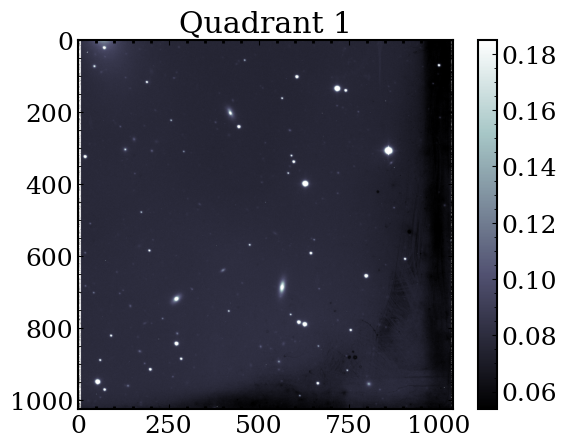

In [27]:
# processing quadrant 1

# bias corrected flat image
A1z_kepler = quadrant1_z_flat - quadrant1_kepler_bias

# reducing science image
Q1z_kepler = fits.getdata(science_kepler_list[1],1)
I1z_kepler = (Q1z_kepler - quadrant1_kepler_bias)/A1z_kepler

# plotting quadrant 1
norm = ImageNormalize(I1z_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 1')
plt.imshow(I1z_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()
plt.show()

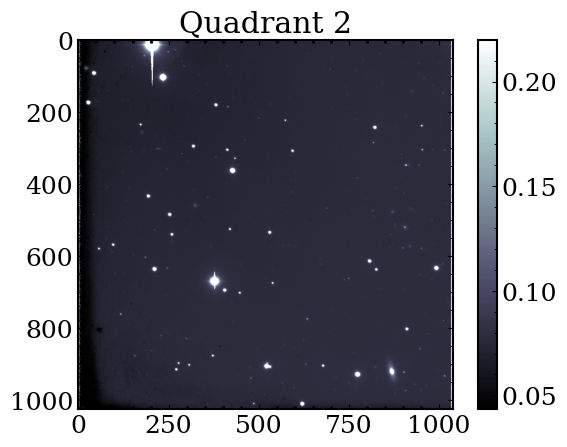

In [28]:
# processing quadrant 2

# bias corrected flat image
A2z_kepler = quadrant2_z_flat - quadrant2_kepler_bias

# reducing science image
Q2z_kepler = fits.getdata(science_kepler_list[1],2)
I2z_kepler = (Q2z_kepler - quadrant2_kepler_bias)/A2z_kepler

# plotting quadrant 2
norm = ImageNormalize(I2z_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 2')
plt.imshow(I2z_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()
plt.show()

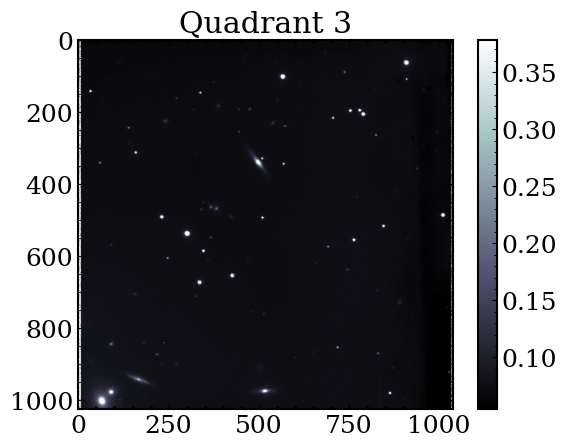

In [29]:
# processing quadrant 3

# bias corrected flat image
A3z_kepler = quadrant3_z_flat - quadrant3_kepler_bias

# reducing science image
Q3z_kepler = fits.getdata(science_kepler_list[1],3)
I3z_kepler = (Q3z_kepler - quadrant3_kepler_bias)/A3z_kepler

# plotting quadrant 3
norm = ImageNormalize(I3z_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 3')
plt.imshow(I3z_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()
plt.show()


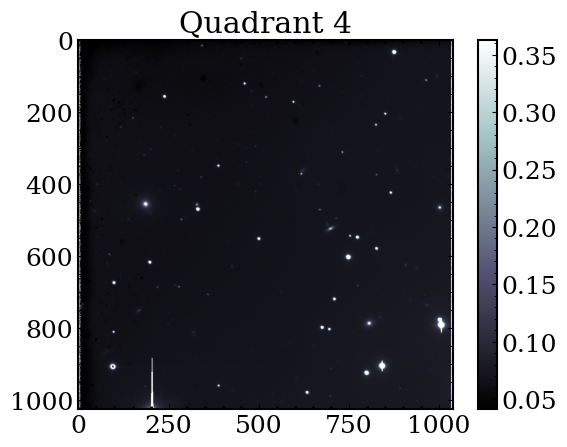

In [30]:
# processing quadrant 4

# bias corrected flat image
A4z_kepler = quadrant4_z_flat - quadrant4_kepler_bias

# reducing science image
Q4z_kepler = fits.getdata(science_kepler_list[1],4)
I4z_kepler = (Q4z_kepler - quadrant4_kepler_bias)/A4z_kepler

# plotting quadrant 4
norm = ImageNormalize(I4z_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 4')
plt.imshow(I4z_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()
plt.show()

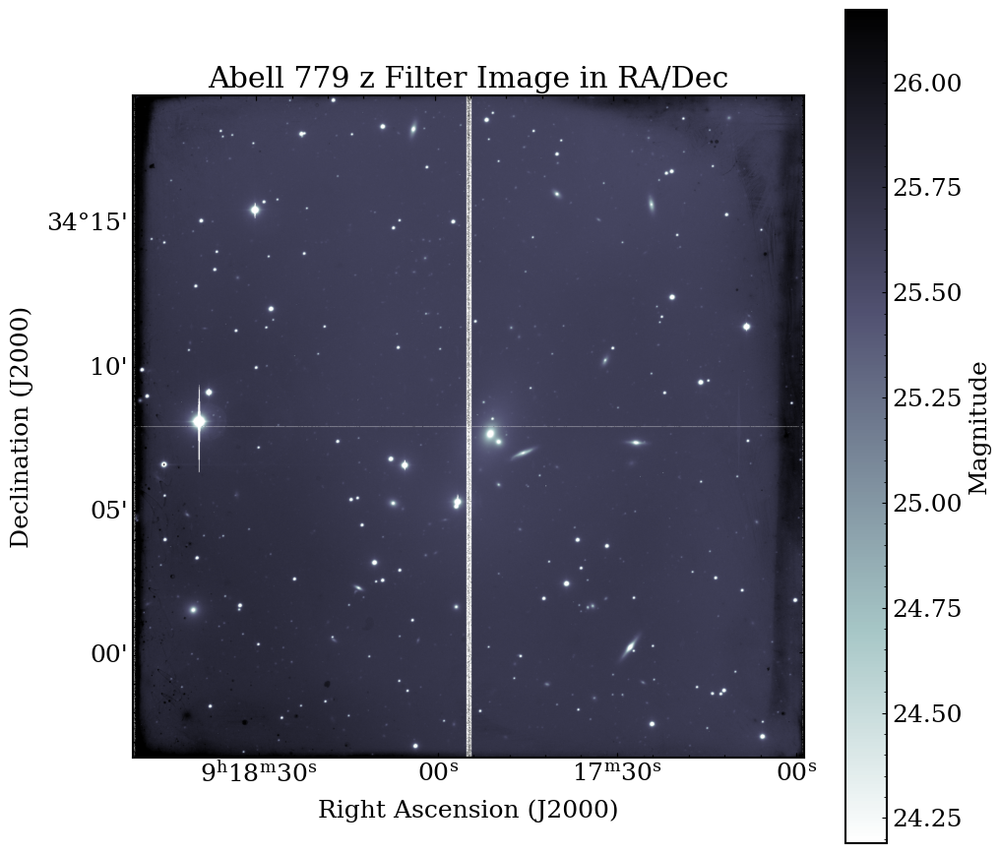

array([[22.83      , 23.58257499, 20.7172549 , ..., 47.83      ,
        47.83      , 47.83      ],
       [23.10286117, 47.83      ,        -inf, ..., 47.83      ,
        47.83      , 47.83      ],
       [22.83      , 22.93348171, 24.02280314, ..., 23.07227503,
        47.83      , 23.14234684],
       ...,
       [22.38977185, 20.88462187, 47.83      , ..., 47.83      ,
        23.27022815, 21.32485002],
       [47.83      , 21.83514998, 47.83      , ..., 21.32485002,
        47.83      , 22.83      ],
       [23.58257499, 21.63719686, 22.38977185, ...,        -inf,
        20.97909328, 21.73166827]])

In [31]:
# piecing together processed quadrants


# grabs the specific science file that will be used to extract RA and Dec information - make sure this variable
# is changed properly to the corresponding file being processed for accurate RA/Dec measurements
wcs_header_reference_z = fits.open('drive/MyDrive/Astron100_Final_Project_Data/kepler_science_images/Copy of 0057.A779.fits')

# defining function to convert counts to magnitude
def counts_to_magnitude(counts, zero_point):
    counts = np.clip(counts, 1e-10, None)  # clipping any non-positive values
    return -2.5 * np.log10(counts) + zero_point

def mosaic_final_z(hdulist, position, show_plot=True):

  # extracting world coordinate system (WCS) from one of the science files fits header
  wcs = WCS(wcs_header_reference_z[1].header)

  # uploading the quadrants
  quadrants = [hdulist[i] for i in range(len(hdulist))]

  # converting to magnitude
  z_zero_point = 22.83 # zeropoint of SDSS filter
  quadrants = [counts_to_magnitude(quadrants[i], z_zero_point) for i in range(len(quadrants))] # calling on zero point function

  # defining dimensions
  height, width = quadrants[0].shape

  max_row = max(p[0] for p in position) + 1
  max_column = max(p[1] for p in position) + 1
  mosaic = np.zeros((max_row * height, max_column * width), dtype=quadrants[0].dtype)

  # placing quadrants in a mosaic
  for i, (row, col) in enumerate(position):
      mosaic[row * height:(row + 1) * height, col * width:(col + 1) * width] = quadrants[i]

  # adjusting the world coordinate system to mosaic scale; subtracting from crpix tells WCS how far the reference pixel has now been shifted
  # bc original quadrants are stitched together inside a bigger image
  wcs.wcs.crpix[0] -= width * position[0][1] # tells WCS how far right the first quadrant is
  wcs.wcs.crpix[1] -= height * position[0][0] # tells WCS how far down the first quadrant is

  # tells function how to plot when show_plot=True argument is given
  if show_plot:
    plt.rcParams['legend.frameon'] = True
    plt.rcParams['legend.fontsize'] = 14
    plt.rcParams['legend.borderpad'] = 0.3
    plt.rcParams['legend.labelspacing'] = 0.3
    plt.rcParams['legend.handletextpad'] = 0.3
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'DejaVu Serif'
    plt.rcParams['font.weight'] = 'light'
    plt.rcParams['font.size'] = 18
    plt.rcParams['xtick.top'] = True
    plt.rcParams['ytick.right'] = True
    plt.rcParams['ytick.minor.visible'] = True
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.rcParams['xtick.minor.visible'] = True
    plt.rcParams['xtick.minor.width'] = 2
    plt.rcParams["axes.linewidth"] = 1.5

    plt.figure(figsize=(11,11))
    norm = ImageNormalize(quadrants, interval=PercentileInterval(97.5))

    ax = plt.subplot(projection=wcs)
    im = ax.imshow(mosaic, cmap = "bone_r", norm=norm)

    ax.set_xlabel('Right Ascension (J2000)') # labeling axes
    ax.set_ylabel('Declination (J2000)')

    plt.title('Abell 779 z Filter Image in RA/Dec')
    plt.colorbar(im, ax=ax, orientation='vertical', label='Magnitude')
    plt.show()

  return mosaic

# now loading in processed quadrants as a list
hdulist_z = [I1z_kepler, I2z_kepler, I3z_kepler, I4z_kepler]

# orienting the quadrants
position = [(1,1),(1,0),(0,1),(0,0)]

# calling on function to create final image
mosaic_final_z(hdulist_z, position, show_plot=True)

## **Reducing KeplerCam Data (i filter)**

**How to Use**
- Change the index number of science_kepler_list defined as the Q1i_kepler/Q2i_kepler/Q3i_kepler/Q4i_kepler variables and run all 4 quadrant processing blocks.
- Once all science_kepler_list indices are changed, the new processed files are automatically loaded into the visualization function and pieced together.

In [32]:
# master flat list for all quadrants
quadrant1_i_flat = KFImaster_flats_1
quadrant2_i_flat = KFImaster_flats_2
quadrant3_i_flat = KFImaster_flats_3
quadrant4_i_flat = KFImaster_flats_4

# master bias list for all quadrants
quadrant1_kepler_bias = KBmaster_bias_1
quadrant2_kepler_bias = KBmaster_bias_2
quadrant3_kepler_bias = KBmaster_bias_3
quadrant4_kepler_bias = KBmaster_bias_4

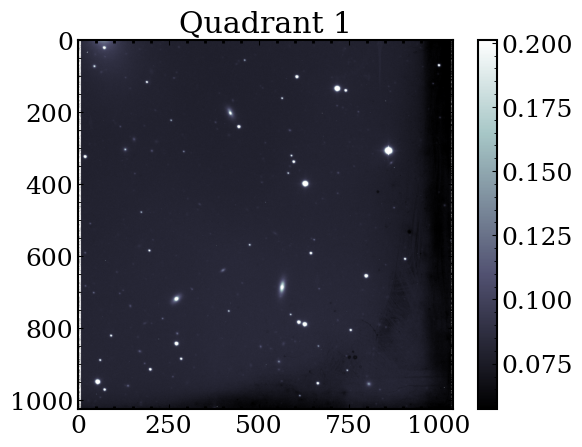

In [33]:
# processing quadrant 1

# bias corrected flat image
A1i_kepler = KFImaster_flats_1

# reducing science image
Q1i_kepler = fits.getdata(science_kepler_list[1],1)
I1i_kepler = (Q1i_kepler - quadrant1_kepler_bias)/A1i_kepler

# plotting quadrant 1
norm = ImageNormalize(I1i_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 1')
plt.imshow(I1i_kepler, norm=norm, cmap='bone')
plt.colorbar()
plt.show()

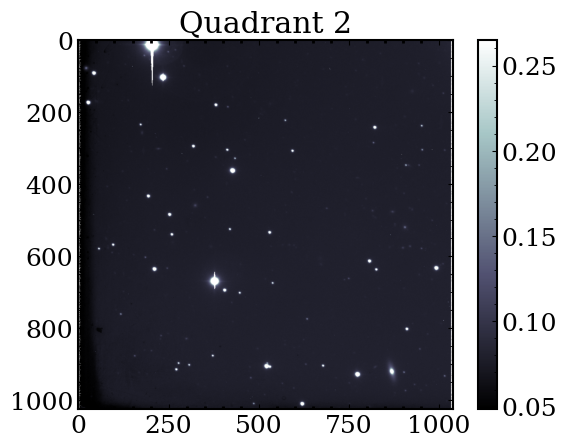

In [34]:
# processing quadrant 2

# bias corrected flat image
A2i_kepler = KFImaster_flats_2

# reducing science image
Q2i_kepler = fits.getdata(science_kepler_list[1],2)
I2i_kepler = (Q2i_kepler - quadrant2_kepler_bias)/A2i_kepler

# plotting quadrant 2
plt.title('Quadrant 2')
norm = ImageNormalize(I2i_kepler, interval=PercentileInterval(97.5))
plt.imshow(I2i_kepler, norm=norm, cmap='bone')
plt.colorbar()
plt.show()

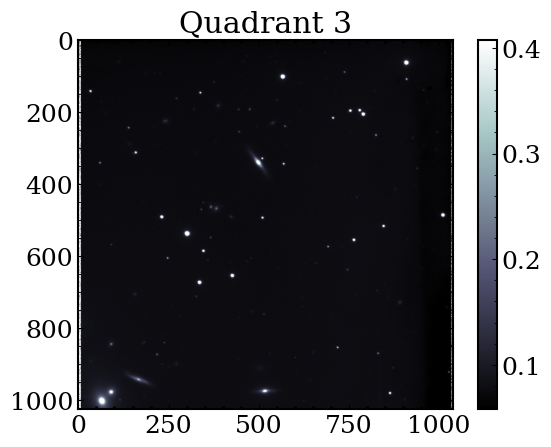

In [35]:
# processing quadrant 3

# bias corrected flat image
A3i_kepler = KFImaster_flats_3

# reducing science image
Q3i_kepler = fits.getdata(science_kepler_list[1],3)
I3i_kepler = (Q3i_kepler - quadrant3_kepler_bias)/A3i_kepler

# plotting quadrant 3
plt.title('Quadrant 3')
norm = ImageNormalize(I3i_kepler, interval=PercentileInterval(97.5))
plt.imshow(I3i_kepler, norm=norm, cmap='bone')
plt.colorbar()
plt.show()

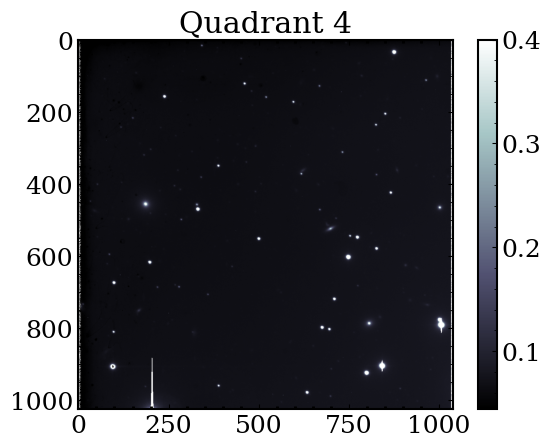

In [36]:
# processing quadrant 4

# bias corrected flat image
A4i_kepler = KFImaster_flats_4

# reducing science image
Q4i_kepler = fits.getdata(science_kepler_list[1],4)
I4i_kepler = (Q4i_kepler - quadrant4_kepler_bias)/A4i_kepler

# plotting quadrant 4
plt.title('Quadrant 4')
norm = ImageNormalize(I4i_kepler, interval=PercentileInterval(97.5))
plt.imshow(I4i_kepler, norm=norm, cmap='bone')
plt.colorbar()
plt.show()

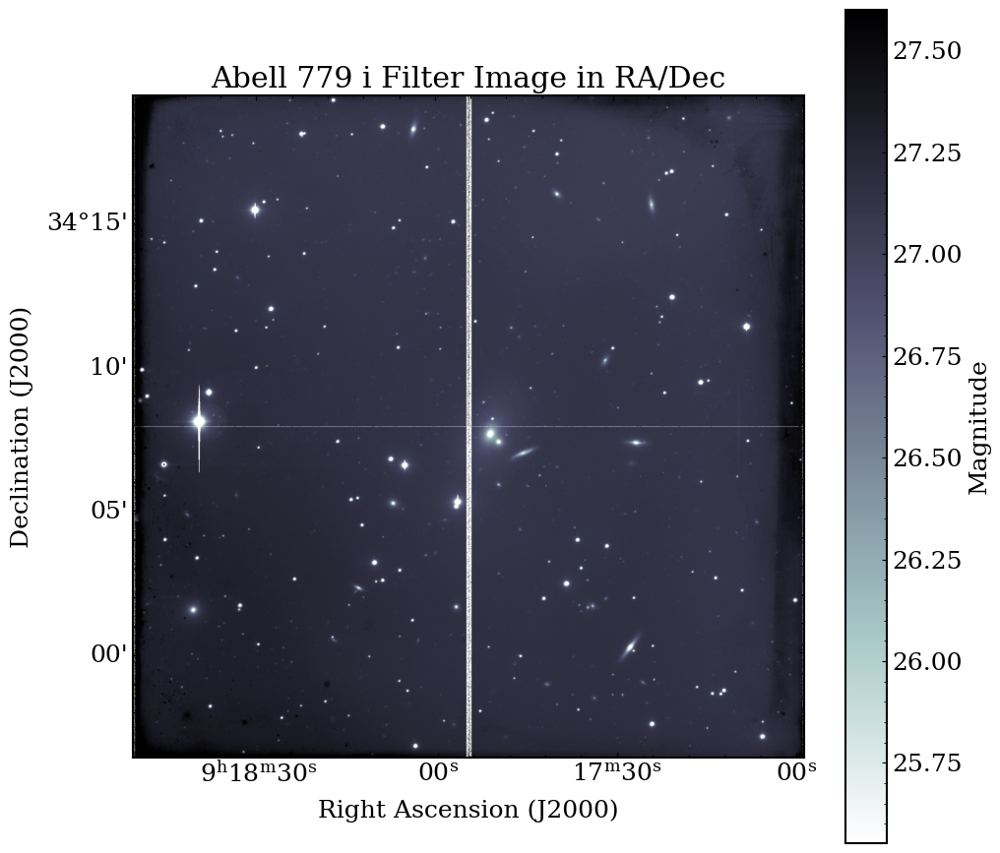

array([[26.4727451 , 25.55280314, 49.36      , ..., 49.36      ,
        49.36      , 49.36      ],
       [25.03211328, 24.36      , 25.55280314, ..., 22.2472549 ,
        22.2472549 , 49.36      ],
       [24.63286117, 23.80537813, 26.10742501, ..., 24.36      ,
        49.36      , 23.91977185],
       ...,
       [49.36      , 24.36      , 23.16719686, ..., 25.55280314,
        25.55280314, 49.36      ],
       [49.36      , 24.72532009, 23.16719686, ..., 49.36      ,
        49.36      , 49.36      ],
       [24.36      , 23.16719686, 23.60742501, ..., 24.36      ,
        21.75651829, 23.86926339]])

In [37]:
# piecing together processed quadrants

# grabs the specific science file that will be used to extract RA and Dec information - make sure this variable
# is changed properly to the corresponding file being processed for accurate RA/Dec measurements
wcs_header_reference_i = fits.open('drive/MyDrive/Astron100_Final_Project_Data/kepler_science_images/Copy of 0057.A779.fits')

# defining function to convert counts to magnitude
def counts_to_magnitude(counts, zero_point):
    counts = np.clip(counts, 1e-10, None)  # clipping any non-positive values
    return -2.5 * np.log10(counts) + zero_point

def mosaic_final_i(hdulist, position, show_plot=True):

  # extracting world coordinate system (WCS) from one of the science files fits header
  wcs = WCS(wcs_header_reference_i[1].header)

  # uploading the quadrants
  quadrants_i = [hdulist[i] for i in range(len(hdulist))]

  # converting to magnitude
  i_zero_point = 24.36
  quadrants_i = [counts_to_magnitude(quadrants_i[i], i_zero_point) for i in range(len(quadrants_i))] # calling on zero point function

  # defining dimensions
  height, width = quadrants_i[0].shape

  max_row = max(p[0] for p in position) + 1
  max_column = max(p[1] for p in position) + 1
  mosaic = np.zeros((max_row * height, max_column * width), dtype=quadrants_i[0].dtype)

  # placing quadrants in a mosaic
  for i, (row, col) in enumerate(position):
      mosaic[row * height:(row + 1) * height, col * width:(col + 1) * width] = quadrants_i[i]

  # adjusting the world coordinate system to mosaic scale; subtracting from crpix tells WCS how far the reference pixel has now been shifted
  # bc original quadrants are stitched together inside a bigger image
  wcs.wcs.crpix[0] -= width * position[0][1] # tells WCS how far right the first quadrant is
  wcs.wcs.crpix[1] -= height * position[0][0] # tells WCS how far down the first quadrant is

  # tells function how to plot when show_plot=True argument is given
  if show_plot:

    plt.rcParams['legend.frameon'] = True
    plt.rcParams['legend.fontsize'] = 14
    plt.rcParams['legend.borderpad'] = 0.3
    plt.rcParams['legend.labelspacing'] = 0.3
    plt.rcParams['legend.handletextpad'] = 0.3
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'DejaVu Serif'
    plt.rcParams['font.weight'] = 'light'
    plt.rcParams['font.size'] = 18
    plt.rcParams['xtick.top'] = True
    plt.rcParams['ytick.right'] = True
    plt.rcParams['ytick.minor.visible'] = True
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.rcParams['xtick.minor.visible'] = True
    plt.rcParams['xtick.minor.width'] = 2
    plt.rcParams["axes.linewidth"] = 1.5

    plt.figure(figsize=(11,11))
    norm = ImageNormalize(quadrants_i, interval=PercentileInterval(97.5))

    ax = plt.subplot(projection=wcs)
    im = ax.imshow(mosaic, cmap = "bone_r", norm=norm)

    ax.set_xlabel('Right Ascension (J2000)') # labeling axes
    ax.set_ylabel('Declination (J2000)')

    plt.title('Abell 779 i Filter Image in RA/Dec')
    plt.colorbar(im, ax=ax, orientation='vertical', label='Magnitude')
    plt.show()

  return mosaic

# now loading in processed quadrants as a list
hdulist_i = [I1i_kepler, I2i_kepler, I3i_kepler, I4i_kepler]

# orienting the quadrants
position = [(1,1),(1,0),(0,1),(0,0)]

# calling on function to create final image
mosaic_final_i(hdulist_i, position, show_plot=True)

## **Reducing Keplercam Data (V filter)**



In [38]:
# master flat list for all quadrants
quadrant1_v_flat = KFVmaster_flats_1
quadrant2_v_flat = KFVmaster_flats_2
quadrant3_v_flat = KFVmaster_flats_3
quadrant4_v_flat = KFVmaster_flats_4

# master bias list for all quadrants
quadrant1_kepler_bias = KBmaster_bias_1
quadrant2_kepler_bias = KBmaster_bias_2
quadrant3_kepler_bias = KBmaster_bias_3
quadrant4_kepler_bias = KBmaster_bias_4

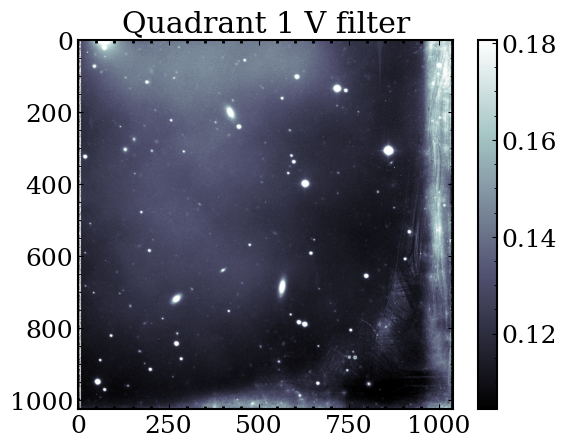

In [39]:
# bias corrected flat image
A1_kepler_v = quadrant1_v_flat - quadrant1_kepler_bias

# reducing science image in the v filter
Q1v_kepler = fits.getdata(science_kepler_list[1], 1)
I1v_kepler = (Q1v_kepler - quadrant1_kepler_bias)/A1_kepler_v

# plotting quadrant 1
norm = ImageNormalize(I1v_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 1 V filter')
plt.imshow(I1v_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()

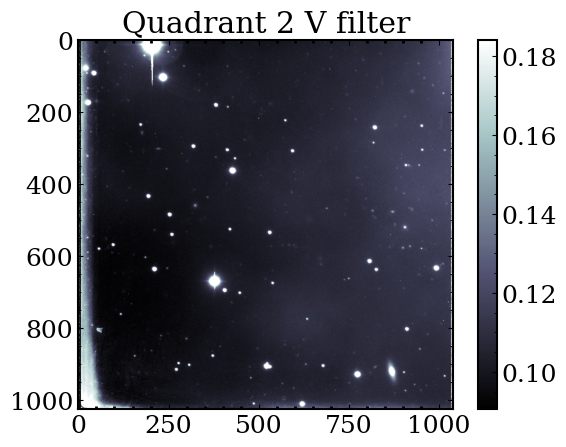

In [40]:
# master bias and flat lists for quadrant 2
#quadrant2_v_flat = KFVmaster_flats_2
quadrant2_kepler_bias = KBmaster_bias_2

# bias corrected flat image
A2_kepler_v = quadrant2_v_flat - quadrant2_kepler_bias

# reducing science image (vfilter)
Q2v_kepler = fits.getdata(science_kepler_list[1], 2)
I2v_kepler = (Q2v_kepler - quadrant2_kepler_bias)/A2_kepler_v

# plotting quadrant 2
norm = ImageNormalize(I2v_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 2 V filter')
plt.imshow(I2v_kepler, norm = norm,
            cmap = "bone")
plt.colorbar()

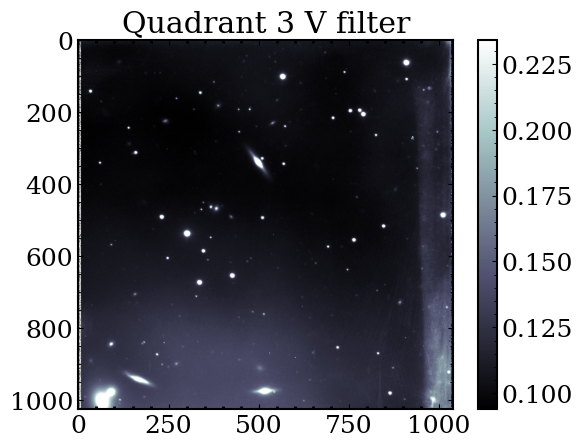

In [41]:
# bias corrected flat
A3_kepler_v = quadrant3_v_flat - quadrant3_kepler_bias

#reducing science image
Q3_kepler_v = fits.getdata(science_kepler_list[1], 3)
I3v_kepler = (Q3_kepler_v - quadrant3_kepler_bias)/A3_kepler_v

# plotting image
norm = ImageNormalize(I3v_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 3 V filter')
plt.imshow(I3v_kepler, norm=norm,
            cmap = "bone")
plt.colorbar()

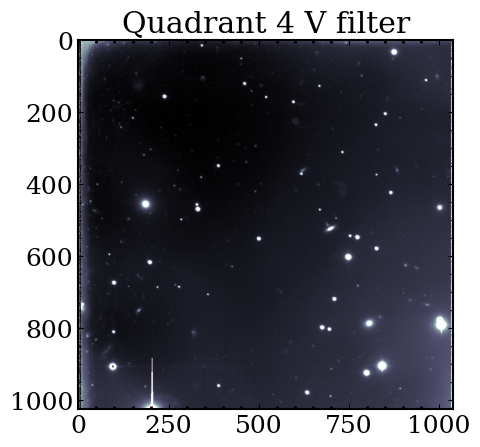

In [42]:
# bias corrected flat
A4_kepler_v = quadrant4_v_flat - quadrant4_kepler_bias

#reducing science image
Q4_kepler_v = fits.getdata(science_kepler_list[1], 4)
I4v_kepler = (Q4_kepler_v - quadrant4_kepler_bias)/A4_kepler_v

# plotting image
norm = ImageNormalize(I4v_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 4 V filter')
plt.imshow(I4v_kepler, norm=norm,
            cmap = "bone")

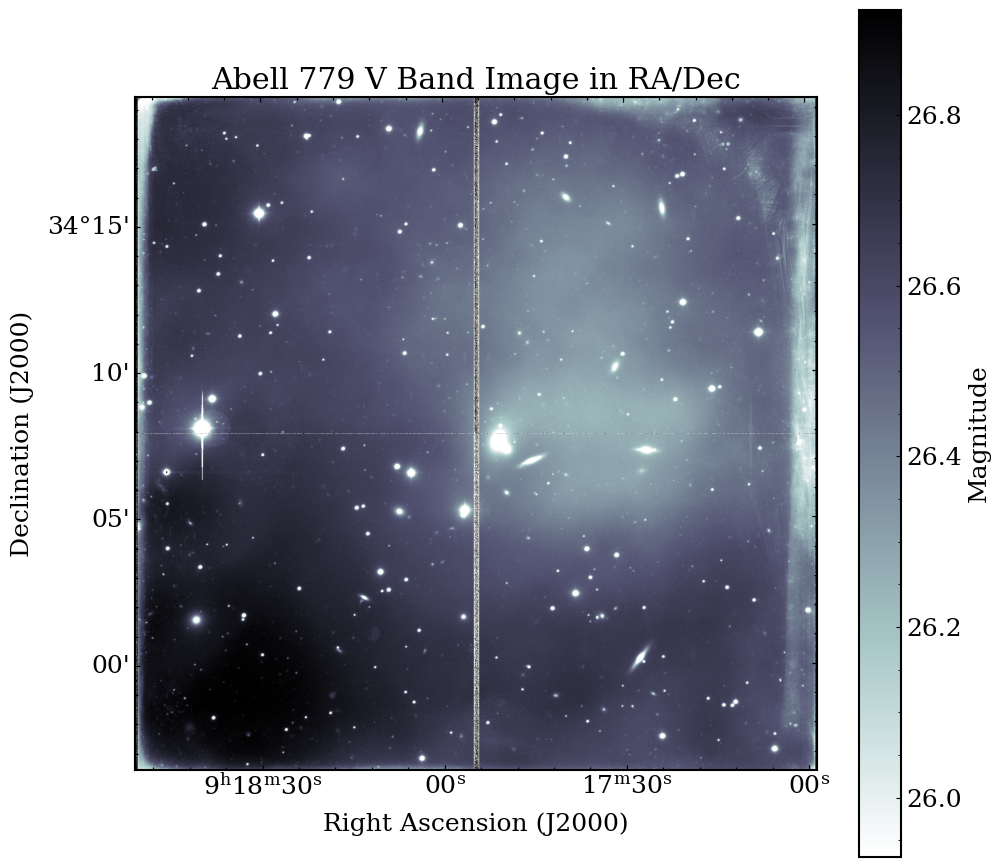

array([[49.15      , 24.15      , 49.15      , ..., 49.15      ,
        24.59022815, 23.70977185],
       [24.15      , 25.34280314, 49.15      , ..., 49.15      ,
        49.15      , 49.15      ],
       [24.15      , 22.40257499, 25.34280314, ..., 24.39227503,
        49.15      , 22.95719686],
       ...,
       [49.15      , 49.15      , 21.76439373, ...,        -inf,
        24.15      , 23.39742501],
       [49.15      , 49.15      , 49.15      , ..., 24.15      ,
        24.90257499, 24.15      ],
       [49.15      , 22.95719686, 49.15      , ..., 23.39742501,
        49.15      , 22.73932142]])

In [43]:
# piecing together processed quadrants

# grabs the specific science file that will be used to extract RA and Dec information - make sure this variable
# is changed properly to the corresponding file being processed for accurate RA/Dec measurements
wcs_header_reference_v = fits.open('drive/MyDrive/Astron100_Final_Project_Data/kepler_science_images/Copy of 0057.A779.fits')

# defining function to convert counts to magnitude
def counts_to_magnitude(counts, zero_point):
    counts = np.clip(counts, 1e-10, None)  # clipping any non-positive values
    return -2.5 * np.log10(counts) + zero_point

def mosaic_final_V(hdulist, position, show_plot=True):

  # extracting world coordinate system (WCS) from one of the science files fits header
  wcs = WCS(wcs_header_reference_v[1].header)

  # uploading the quadrants
  quadrants = [hdulist[i] for i in range(len(hdulist))]

  # calibrating for magnitude
  V_zero_point = 24.15 # from https://www.eso.org/sci/facilities/lasilla/instruments/wfi/inst/zeropoints.html
  quadrants = [counts_to_magnitude(quadrants[i], V_zero_point) for i in range(len(quadrants))] # calling on zero point function

  # defining dimensions
  height, width = quadrants[0].shape

  max_row = max(p[0] for p in position) + 1
  max_column = max(p[1] for p in position) + 1
  mosaic = np.zeros((max_row * height, max_column * width), dtype=quadrants[0].dtype)

  # placing quadrants in a mosaic
  for i, (row, col) in enumerate(position):
      mosaic[row * height:(row + 1) * height, col * width:(col + 1) * width] = quadrants[i]

  # adjusting the world coordinate system to mosaic scale; subtracting from crpix tells WCS how far the reference pixel has now been shifted
  # bc original quadrants are stitched together inside a bigger image
  wcs.wcs.crpix[0] -= width * position[0][1] # tells WCS how far right the first quadrant is
  wcs.wcs.crpix[1] -= height * position[0][0] # tells WCS how far down the first quadrant is

  # tells function how to plot when show_plot=True argument is given
  if show_plot:
    plt.rcParams['legend.frameon'] = True
    plt.rcParams['legend.fontsize'] = 14
    plt.rcParams['legend.borderpad'] = 0.3
    plt.rcParams['legend.labelspacing'] = 0.3
    plt.rcParams['legend.handletextpad'] = 0.3
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'DejaVu Serif'
    plt.rcParams['font.weight'] = 'light'
    plt.rcParams['font.size'] = 18
    plt.rcParams['xtick.top'] = True
    plt.rcParams['ytick.right'] = True
    plt.rcParams['ytick.minor.visible'] = True
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.rcParams['xtick.minor.visible'] = True
    plt.rcParams['xtick.minor.width'] = 2
    plt.rcParams["axes.linewidth"] = 1.5

    plt.figure(figsize=(11,11))
    norm = ImageNormalize(quadrants, interval=PercentileInterval(97.5))

    ax = plt.subplot(projection=wcs)
    im = ax.imshow(mosaic, cmap = "bone_r", norm=norm)

    ax.set_xlabel('Right Ascension (J2000)') # labeling axes
    ax.set_ylabel('Declination (J2000)')

    plt.title('Abell 779 V Band Image in RA/Dec')
    plt.colorbar(im, ax=ax, orientation='vertical', label='Magnitude')
    plt.show()

  return mosaic

# now loading in processed quadrants as a list
hdulist_V = [I1v_kepler, I2v_kepler, I3v_kepler, I4v_kepler]

# orienting the quadrants
position = [(1,1),(1,0),(0,1),(0,0)]

# calling on function to create final image
mosaic_final_V(hdulist_V, position, show_plot=True)

## **Reducing KeplerCam (B Band)**

In [44]:
# master flats and bias for all quadrants
quadrant1_B_flat = KFBmaster_flats_1
quadrant2_B_flat = KFBmaster_flats_2
quadrant3_B_flat = KFBmaster_flats_3
quadrant4_B_flat = KFBmaster_flats_4

# master bias list for all quadrants
quadrant1_kepler_bias = KBmaster_bias_1
quadrant2_kepler_bias = KBmaster_bias_2
quadrant3_kepler_bias = KBmaster_bias_3
quadrant4_kepler_bias = KBmaster_bias_4

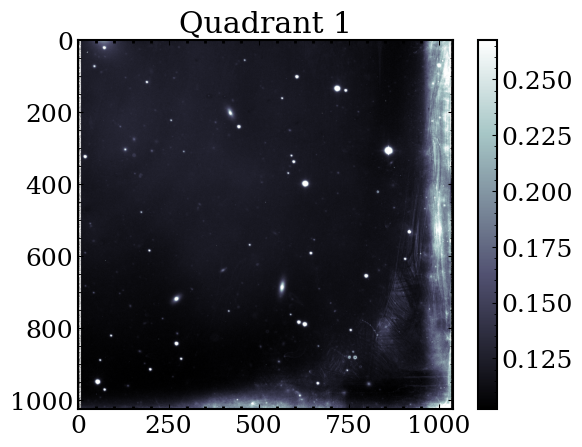

In [45]:
# processing quadrant 1

# bias corrected flat image
A1B_kepler = quadrant1_B_flat - KBmaster_bias_1

# reducing science image
Q1B_kepler = fits.getdata(science_kepler_list[1],1)
I1B_kepler = (Q1B_kepler - quadrant1_kepler_bias)/A1B_kepler

# plotting quadrant 1
norm = ImageNormalize(I1B_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 1')
plt.imshow(I1B_kepler, norm=norm, cmap='bone')
plt.colorbar()
plt.show()

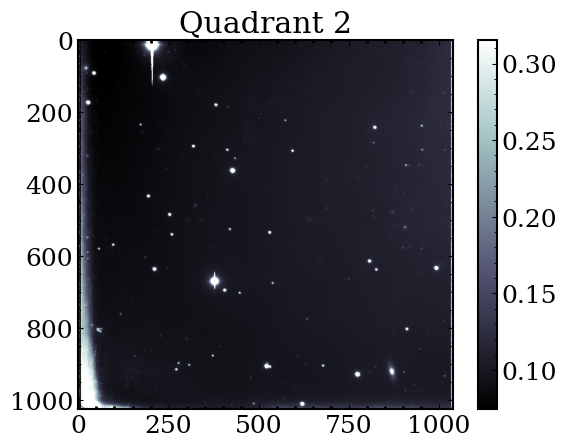

In [46]:
# processing quadrant 2

# bias corrected flat image
A2B_kepler = quadrant2_B_flat - KBmaster_bias_2

# reducing science image
Q2B_kepler = fits.getdata(science_kepler_list[1],2)
I2B_kepler = (Q2B_kepler - quadrant2_kepler_bias)/A2B_kepler

# plotting quadrant 2
norm = ImageNormalize(I2B_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 2')
plt.imshow(I2B_kepler, norm=norm, cmap='bone')
plt.colorbar()
plt.show()

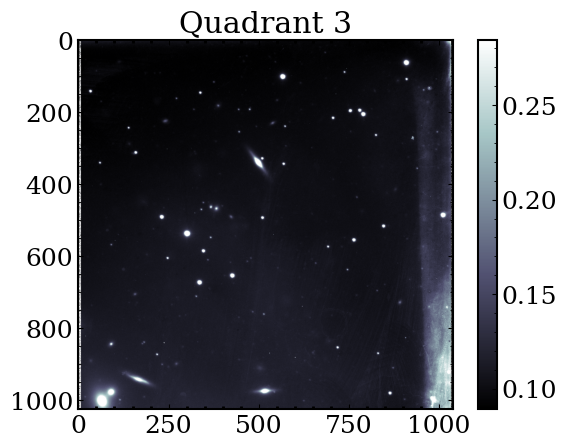

In [47]:
# processing quadrant 3

# bias corrected flat image
A3B_kepler = quadrant3_B_flat - KBmaster_bias_3

# reducing science image
Q3B_kepler = fits.getdata(science_kepler_list[1],3)
I3B_kepler = (Q3B_kepler - quadrant3_kepler_bias)/A3B_kepler

# plotting quadrant 3
norm = ImageNormalize(I3B_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 3')
plt.imshow(I3B_kepler, norm=norm, cmap='bone')
plt.colorbar()
plt.show()

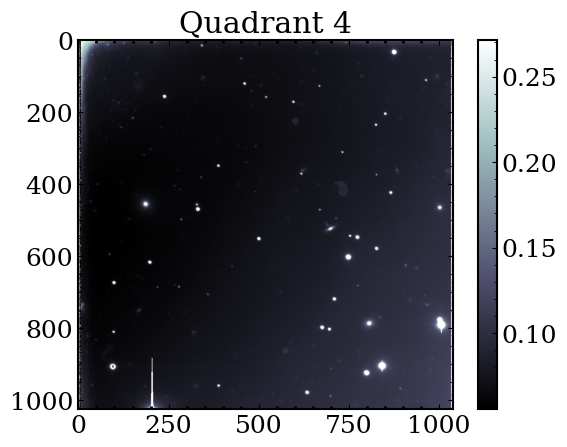

In [48]:
# processing quadrant 4

# bias corrected flat image
A4B_kepler = quadrant4_B_flat - KBmaster_bias_4

# reducing science image
Q4B_kepler = fits.getdata(science_kepler_list[1],4)
I4B_kepler = (Q4B_kepler - quadrant4_kepler_bias)/A4B_kepler

# plotting quadrant 4
norm = ImageNormalize(I4B_kepler, interval=PercentileInterval(97.5))
plt.title('Quadrant 4')
plt.imshow(I4B_kepler, norm=norm, cmap='bone')
plt.colorbar()
plt.show()

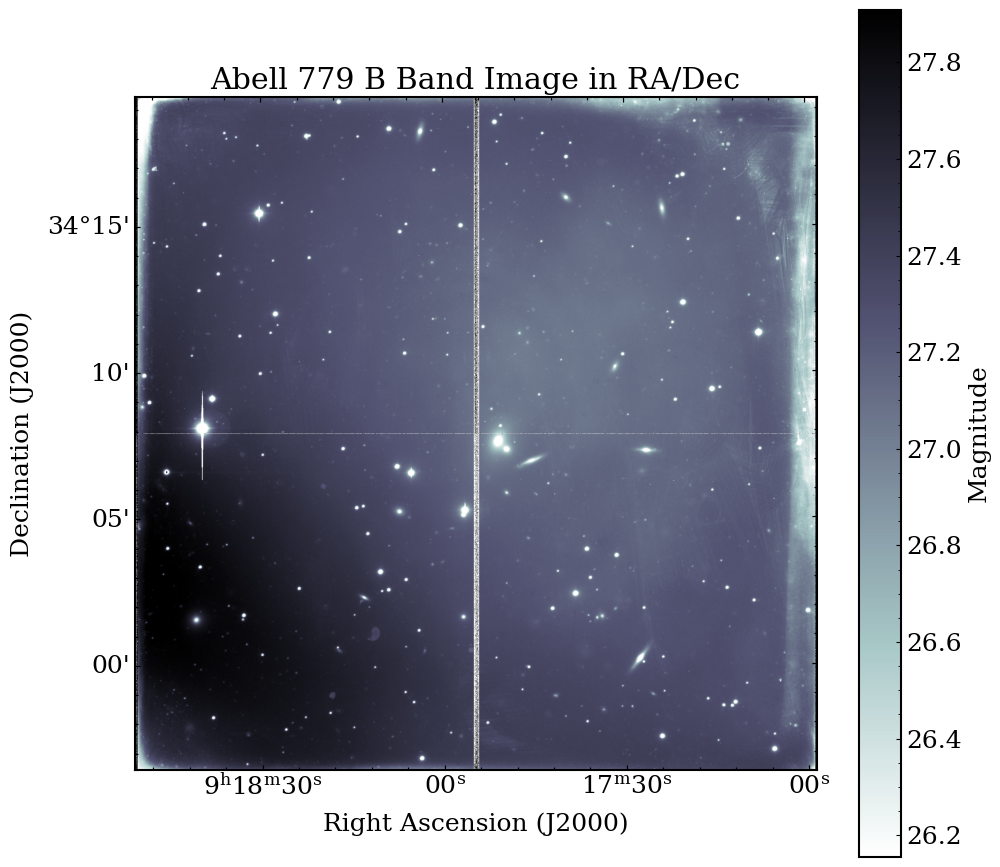

(array([[25.80485002, 24.05742501, 49.81      , ..., 49.81      ,
         24.81      , 49.81      ],
        [24.64263303, 24.05742501, 49.81      , ..., 49.81      ,
         23.44982989, 49.81      ],
        [24.44467991, 24.25537813, 26.00280314, ..., 25.05227503,
                -inf,        -inf],
        ...,
        [25.12234684, 22.86462187, 49.81      , ..., 24.05742501,
         24.81      , 23.30485002],
        [49.81      , 49.81      , 49.81      , ..., 23.30485002,
         49.81      , 25.56257499],
        [24.81      , 23.61719686,        -inf, ..., 49.81      ,
         49.81      , 22.95909328]]),
 WCS Keywords
 
 Number of WCS axes: 2
 CTYPE : 'RA---TAN' 'DEC--TAN' 
 CRVAL : 139.9452066 33.7497406 
 CRPIX : -1031.75 -1024.75 
 CD1_1 CD1_2  : -0.0001867 0.0 
 CD2_1 CD2_2  : 0.0 0.0001867 
 NAXIS : 1040  1025)

In [49]:
# piecing together processed quadrants

# grabs the specific science file that will be used to extract RA and Dec information - make sure this variable
# is changed properly to the corresponding file being processed for accurate RA/Dec measurements
wcs_header_reference_b = fits.open('drive/MyDrive/Astron100_Final_Project_Data/kepler_science_images/Copy of 0057.A779.fits')

# defining function to convert to magnitude
# defining function to convert counts to magnitude
def counts_to_magnitude(counts, zero_point):
    counts = np.clip(counts, 1e-10, None)  # clipping any non-positive values
    return -2.5 * np.log10(counts) + zero_point

def mosaic_final_B(hdulist, position, show_plot=True):

  # extracting world coordinate system (WCS) from one of the science files fits header
  wcs = WCS(wcs_header_reference_b[1].header)

  # uploading the quadrants
  quadrants = [hdulist[i] for i in range(len(hdulist))]

  # calibrating to magnitude
  B_zero_point = 24.81
  quadrants = [counts_to_magnitude(quadrants[i], B_zero_point) for i in range(len(quadrants))]

  # defining dimensions
  height, width = quadrants[0].shape

  max_row = max(p[0] for p in position) + 1
  max_column = max(p[1] for p in position) + 1
  mosaic = np.zeros((max_row * height, max_column * width), dtype=quadrants[0].dtype)

  # placing quadrants in a mosaic
  for i, (row, col) in enumerate(position):
      mosaic[row * height:(row + 1) * height, col * width:(col + 1) * width] = quadrants[i]

  # adjusting the world coordinate system to mosaic scale; subtracting from crpix tells WCS how far the reference pixel has now been shifted
  # bc original quadrants are stitched together inside a bigger image
  wcs.wcs.crpix[0] -= width * position[0][1] # tells WCS how far right the first quadrant is
  wcs.wcs.crpix[1] -= height * position[0][0] # tells WCS how far down the first quadrant is

  # tells function how to plot when show_plot=True argument is given
  if show_plot:
    plt.rcParams['legend.frameon'] = True
    plt.rcParams['legend.fontsize'] = 14
    plt.rcParams['legend.borderpad'] = 0.3
    plt.rcParams['legend.labelspacing'] = 0.3
    plt.rcParams['legend.handletextpad'] = 0.3
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'DejaVu Serif'
    plt.rcParams['font.weight'] = 'light'
    plt.rcParams['font.size'] = 18
    plt.rcParams['xtick.top'] = True
    plt.rcParams['ytick.right'] = True
    plt.rcParams['ytick.minor.visible'] = True
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.rcParams['xtick.minor.visible'] = True
    plt.rcParams['xtick.minor.width'] = 2
    plt.rcParams["axes.linewidth"] = 1.5

    plt.figure(figsize=(11,11))
    norm = ImageNormalize(quadrants, interval=PercentileInterval(97.5))

    ax = plt.subplot(projection=wcs)
    im = ax.imshow(mosaic, cmap = "bone_r", norm=norm)

    ax.set_xlabel('Right Ascension (J2000)') # labeling axes
    ax.set_ylabel('Declination (J2000)')

    plt.title('Abell 779 B Band Image in RA/Dec')
    plt.colorbar(im, ax=ax, orientation='vertical', label='Magnitude')
    plt.show()

  return mosaic, wcs

# now loading in processed quadrants as a list
hdulist_B = [I1B_kepler, I2B_kepler, I3B_kepler, I4B_kepler]

# orienting the quadrants
position = [(1,1),(1,0),(0,1),(0,0)]

# calling on function to create final image
mosaic_final_B(hdulist_B, position, show_plot=True)

## **FAST Master Bias and Flat Lists**

> Code for reducing Abell 779 FAST spectroscopic data



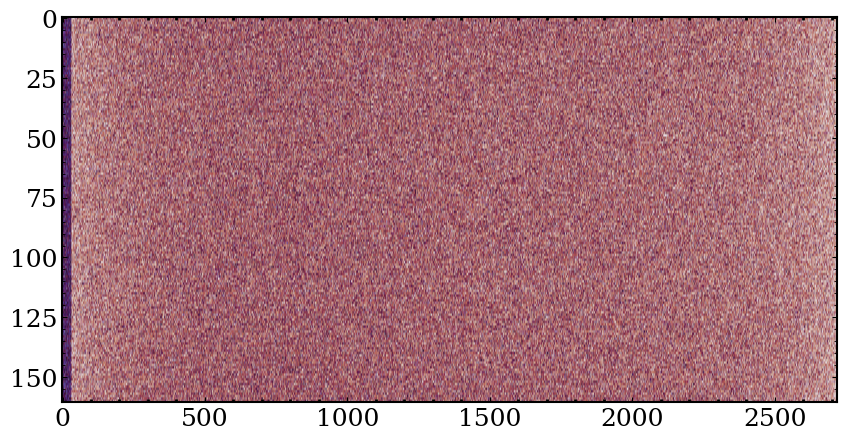

In [50]:
#plotting master bias data

fl1 = glob.glob('drive/MyDrive/Astron100_Final_Project_Data/bias_fast/*BIAS*fits')
data_bias = fits.getdata(fl1[3])
fig = plt.figure(figsize=(10,5))
plt.imshow(data_bias, aspect='auto', vmax=np.percentile(data_bias, 90), cmap='twilight')

#making bias master list
master_bias = []

for fn in fl1:
  data_bias = fits.getdata(fn)
  master_bias.append(data_bias[None])

master_bias = np.concatenate(master_bias, axis = 0)
master_bias_median = np.median(master_bias, axis = 0) #master median bias list


In [51]:
# Code below only necessary as a sanity check to make sure master bias list was created

# # plotting master bias image
# fig = plt.figure(figsize=(10,5))
# plt.imshow(master_bias_median, aspect='auto', vmax = np.percentile(master_bias_median, 90))

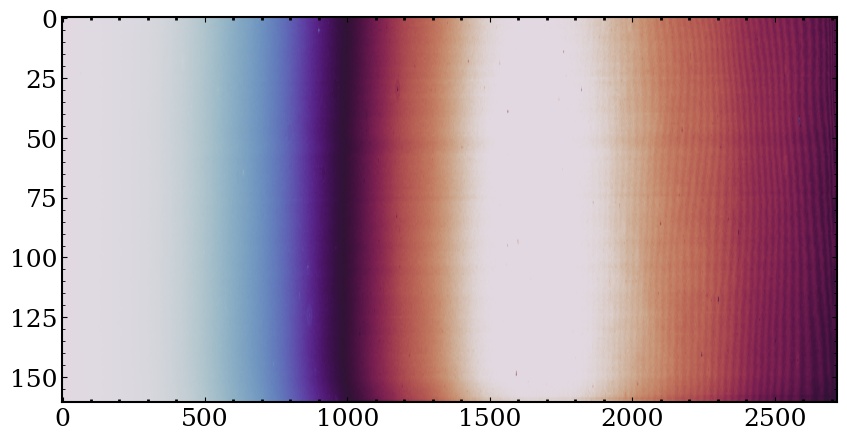

In [52]:
# plotting flat data

fl2 = glob.glob('drive/MyDrive/Astron100_Final_Project_Data/flat_fast/*FLAT*fits')
data_flat = fits.getdata(fl2[0])
fig = plt.figure(figsize=(10,5))
plt.imshow(data_flat, aspect='auto', vmax = np.percentile(data_flat, 90), cmap='twilight')

#making flat master list and median
master_flats = []

for fn in fl2:
  data_flat = fits.getdata(fn)
  master_flats.append(data_flat[None])

master_flats = np.concatenate(master_flats, axis = 0)
master_flats_median = np.median(master_flats, axis = 0) #master median flats list

In [53]:
# Another sanity check - only to make sure that the master flat list was created properly

# # plotting master flats data
# fig = plt.figure(figsize=(10,5))
# plt.imshow(master_flats_median, aspect='auto', vmax = np.percentile(master_flats_median, 90) )

## **Visualizing Comp and Raw Science Data**
**OPTIONAL** -- Just extra code blocks that show what the comp files and raw science files look like!

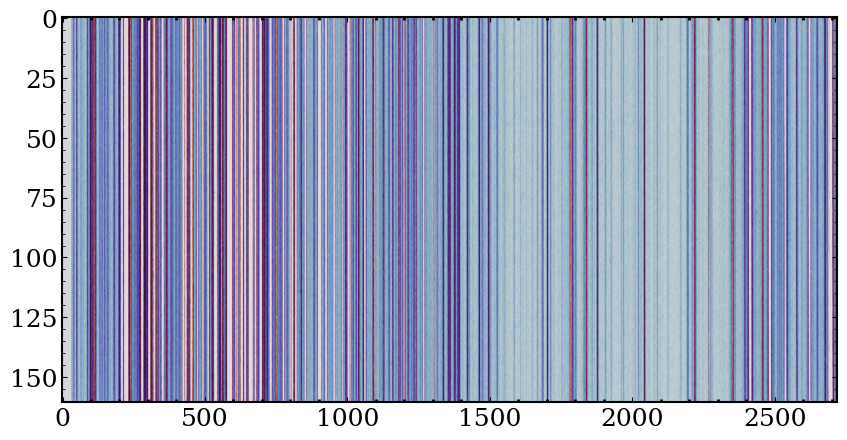

In [54]:
# plotting comp data

fl3 = glob.glob('drive/MyDrive/Astron100_Final_Project_Data/comp/*COMP*fits')
data_comp = fits.getdata(fl3[1])
fig = plt.figure(figsize=(10,5))
plt.imshow(data_comp, aspect='auto', vmax = np.percentile(data_comp, 90), cmap='twilight')

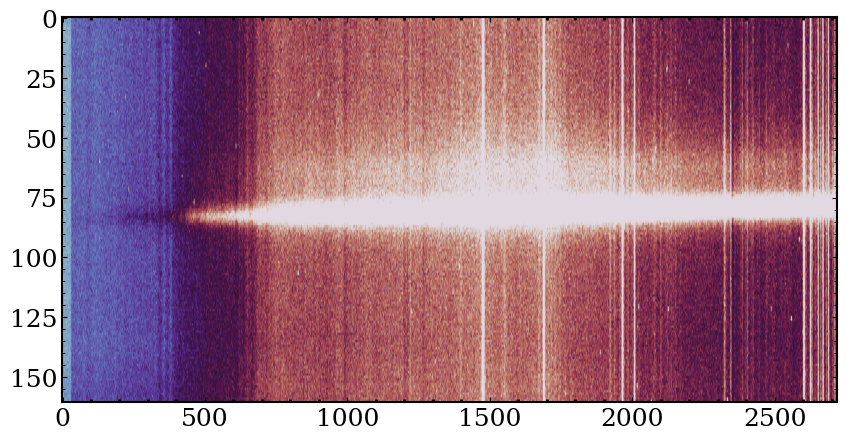

array([[ 795,  801,  784, ...,  864,  860, 1062],
       [ 792,  798,  800, ...,  861,  855, 1063],
       [ 796,  794,  793, ...,  850,  876, 1009],
       ...,
       [ 811,  805,  805, ...,  873,  880,  996],
       [ 794,  798,  802, ...,  857,  882, 1021],
       [ 801,  801,  804, ...,  861,  858,  997]], dtype=uint16)

In [55]:
# creating a function that plots each FAST spectra science image

def fast_spectra(science_file, show_plot=True):
  if show_plot:
    fig = plt.figure(figsize=(10,5))
    plt.imshow(science_file, aspect='auto', vmax = np.percentile(science_file, 90), cmap='twilight')
    plt.show()
  return science_file

science_file = fits.getdata('drive/MyDrive/Astron100_Final_Project_Data/fast_science_images/Copy of 0060.NGC2831.fits')
fast_spectra(science_file, show_plot=True)

## **Reducing Spectrograph Data**

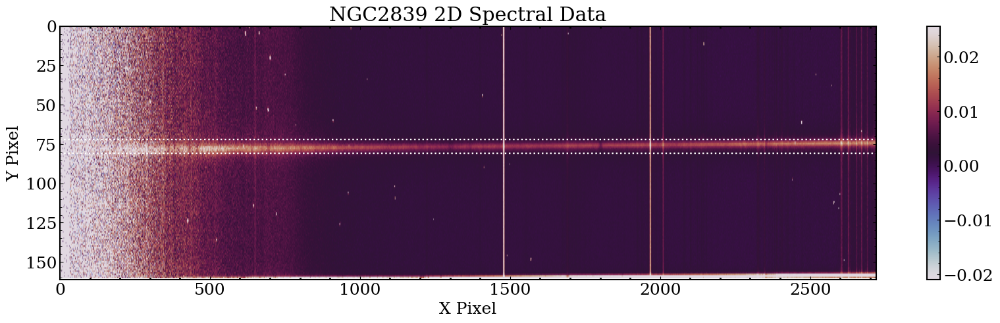

array([[ 2.80000000e+00,  3.00000000e+00, -2.00000000e-01, ...,
         1.87122157e-03,  1.73743538e-03,  1.63747026e-03],
       [ 2.33333333e+00, -2.00000000e+00, -5.00000000e+00, ...,
         9.21895006e-04,  1.25195618e-03,  1.56023110e-03],
       [-1.66666667e-01,  1.60000000e+00, -4.00000000e+00, ...,
         1.39997926e-03,  1.42418443e-03,  1.59107761e-03],
       ...,
       [-2.25000000e+00,  1.90000000e+07,  6.66666667e+00, ...,
         2.83637230e-02,  3.03459438e-02,  2.57519349e-02],
       [ 5.00000000e+00,  1.10000000e+07,  3.00000000e+00, ...,
         4.12269512e-02,  3.71572691e-02,  3.12186230e-02],
       [ 1.70000000e+01,  1.00000000e+00,  5.50000000e+00, ...,
         1.49315637e-02,  1.56376518e-02,  1.79197627e-02]])

In [56]:
# pipeline for spectroscopic data reduction

# defining variables for function
science_file_path = 'drive/MyDrive/Astron100_Final_Project_Data/fast_science_images/Copy of 0044.NGC2839.fits'
science_file = fits.getdata(science_file_path)

# function to reduce and annotate 2d spectra
def spectra_reduced(science_file, master_bias, master_flats, plot_name, show_plot=True):

  """
  Pipeline for reducing spectroscopic science files from FAST
  """
  # load science file data
  science_file_path = 'drive/MyDrive/Astron100_Final_Project_Data/fast_science_images/Copy of 0044.NGC2839.fits'
  science_file = fits.getdata(science_file_path)

  # defining equations for data reduction
  A = master_flats - master_bias
  A_safe = np.where(A == 0, 1e-6, A)  # preventing a division by 0
  Q = science_file
  I = (Q - master_bias) / A_safe # equation for final reduced image

  if show_plot:

  # plotting data
    norm = ImageNormalize(I, interval=ZScaleInterval())
    plt.figure(figsize=(20,5))
    plt.imshow(I, aspect='auto', norm=norm, cmap='twilight')
    #plt.ylim(70,85)

  # setting dimensions
    plt.xlim(0, I.shape[1])
    plt.ylim(I.shape[0], 0)

  # plotting horizontal dotted lines to estimate best intervals for 1d extraction
    plt.plot([0, I.shape[1]], [72, 72], linestyle=':', color='white', linewidth=1.7)
    plt.plot([0, I.shape[1]], [81, 81], linestyle=':', color='white', linewidth=1.7)

  # adding plot labels
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')
    plt.title(plot_name)

  # making everything pretty
    plt.rcParams['legend.frameon'] = True
    plt.rcParams['legend.fontsize'] = 14
    plt.rcParams['legend.borderpad'] = 0.3
    plt.rcParams['legend.labelspacing'] = 0.3
    plt.rcParams['legend.handletextpad'] = 0.3
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'DejaVu Serif'
    plt.rcParams['font.weight'] = 'light'
    plt.rcParams['font.size'] = 18
    plt.rcParams['xtick.top'] = True
    plt.rcParams['ytick.right'] = True
    plt.rcParams['ytick.minor.visible'] = True
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.rcParams['xtick.minor.visible'] = True
    plt.rcParams['xtick.minor.width'] = 2
    plt.rcParams["axes.linewidth"] = 1.5

    plt.colorbar()
    plt.show()

  return I


# change inputs below to generate new reduced data for each fits file
science_file_path = science_file_path

# calling on function - CHANGE TITLE ARGUMENT for each new science file!
spectra_reduced(science_file, master_bias_median, master_flats_median, 'NGC2839 2D Spectral Data', show_plot=True)



## **Summing Peaks Over Regular Intervals (Extracting 1D Spectra)**
- Notes from OH: Plot S/N over regular wavelength intervals; find the peak and width of each S/N for each spectra; sum up the peak + width of each spectra S/N; plot 1D spectra




Text(0.5, 1.0, 'NGC2839 1D Spectral Data')

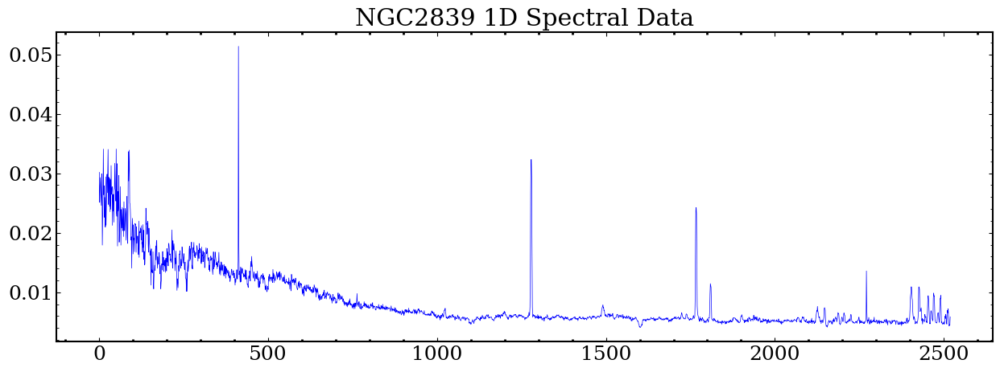

In [74]:
# making 1D spectra with linear extraction method

# calling on 2d reduction pipeline function
data_reduced_easy = spectra_reduced(science_file, master_bias_median, master_flats_median, 'NGC2839 1D Spectral Data', show_plot=False)

# taking the average flux over the y/spatial direction, using intervals approximated by the 2d function
data_1d = data_reduced_easy[76:85,200:].mean(0)

# plotting and labeling
fig=plt.figure(figsize=(15,5))
plt.plot(data_1d, color ='blue', linewidth=0.5)
plt.title('NGC2839 1D Spectral Data')



## **Calibrating 1D Spectrum**
Code adapted from Wasundara Athukoralalage

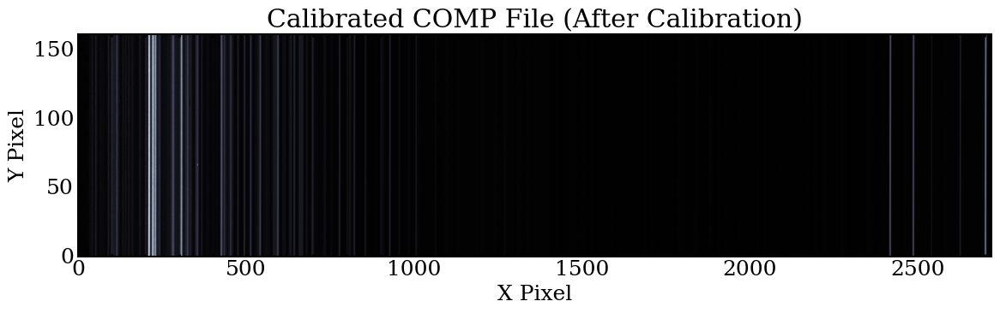

(2720,)


In [58]:
# reducing comp files for calibration

directory1 = 'drive/MyDrive/Astron100_Final_Project_Data/comp'
comp_file = 'Copy of 0062.COMP.fits'  # Specify the COMP file you want to process


# Load the COMP file (before calibration)
comp_file_path = os.path.join(directory1, comp_file)
with fits.open(comp_file_path) as hdul:
    comp_data_raw = hdul[0].data

    # print(f"\nViewing FITS file: {comp_file_path}")
    # print("Header:")
    # print(repr(hdul[0].header))
    # print("\nData shape:")
    # print(hdul[0].data.shape)

# Trim the raw data (same trimming as for bias and flat)
comp_data_trimmed = comp_data_raw[:, :]

# Normalize and subtract bias (using combined bias data)
bias_subtracted_comp = comp_data_trimmed - master_bias_median

# Trim both the bias-subtracted COMP data and the normalized flat to match the smaller size
min_width = min(bias_subtracted_comp.shape[1], master_flats_median.shape[1])

bias_subtracted_comp_trimmed = bias_subtracted_comp[:, :min_width]
normalized_flat_trimmed = master_flats_median[:, :min_width]

# Apply flat correction (normalize by combined flat)
calibrated_comp = bias_subtracted_comp_trimmed / normalized_flat_trimmed

# Plot the raw, trimmed, and calibrated COMP image
fig, axs = plt.subplots(1, 1, figsize=(12, 4))

# Display the calibrated COMP file
axs.imshow(calibrated_comp, cmap='bone', origin='lower', aspect='auto')
axs.set_title('Calibrated COMP File (After Calibration)')
axs.set_xlabel('X Pixel')
axs.set_ylabel('Y Pixel')

plt.tight_layout()
plt.show()

# Create a 1D spectrum by summing over the spatial dimension (Y-axis)
comp_spectrum_1d = np.sum(calibrated_comp, axis=0)
print(comp_spectrum_1d.shape)



Text(0.5, 1.0, '1D Comparison Lamp Spectrum')

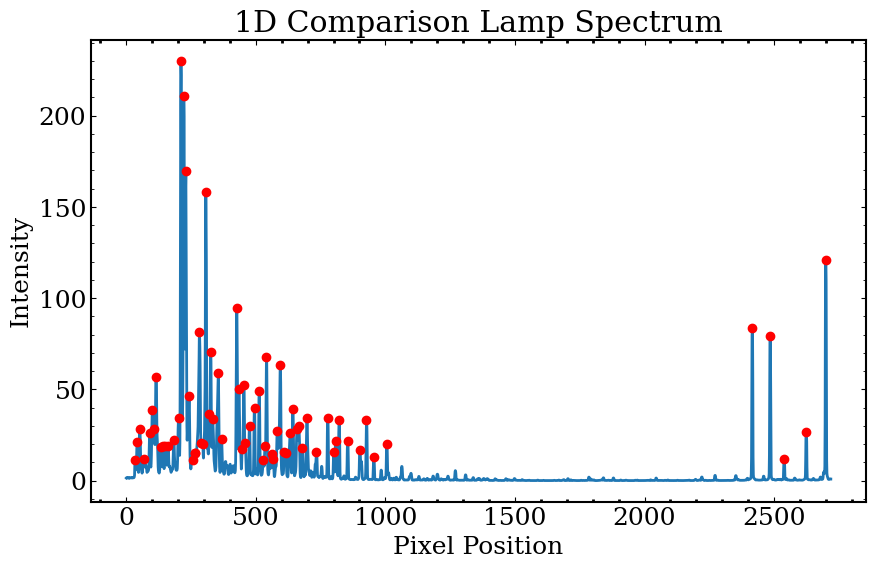

In [59]:
# identifying the peaks of the comp file

peaks, properties = find_peaks(comp_spectrum_1d)

# Sort peaks by intensity and select the 10 most intense peaks
peak_intensities = properties['peak_heights'] = comp_spectrum_1d[peaks]
top_peaks_idx = np.argsort(peak_intensities)[-68:]  # Indices of the 10 highest peaks
top_peaks = peaks[top_peaks_idx]  # Pixel positions of the 10 highest peaks
top_peaks_intensity = comp_spectrum_1d[top_peaks]  # Intensities of the 10 highest peaks


# Plot the 1D comparison spectrum with the 10 most intense peaks marked
plt.figure(figsize=(10, 6))
plt.plot(comp_spectrum_1d, label='Comparison Spectrum')
plt.plot(top_peaks, top_peaks_intensity, 'ro', label='Top 10 Intense Peaks')
plt.xlabel('Pixel Position')
plt.ylabel('Intensity')
plt.title('1D Comparison Lamp Spectrum')

In [60]:
# wavelength solution function for calibration
def plot_wavelength_pixel_solution(
    spectrum, pixel_positions, wavelength_values, wavelength_labels=None, annotate=True,
    figsize=(12, 5), invert_x=False, xlim=None, ylim=None
):

    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(spectrum*150, label='1D Spectrum')
    ax.set_xlabel("Pixel Position")
    ax.set_ylabel("Intensity")
    ax.set_title("1D Spectrum with Known Line Positions")
    ax.grid(True)

    for i, pix in enumerate(pixel_positions):
        wl = wavelength_values[i]
        label = f"{wl:.1f} "
        if wavelength_labels is not None:
            label += f" ({wavelength_labels[i]})"
        ax.axvline(pix, color='red', linestyle='--', alpha=0.5)
        if annotate:
            ax.text(pix, spectrum[int(pix)] -2000000, label,
                    rotation=90, ha='right', va='bottom', fontsize=12, color='red')

    if invert_x:
        ax.invert_xaxis()
    if xlim:
        ax.set_xlim(*xlim)
    if ylim:
        ax.set_ylim(*ylim)

    plt.tight_layout()
    plt.show()

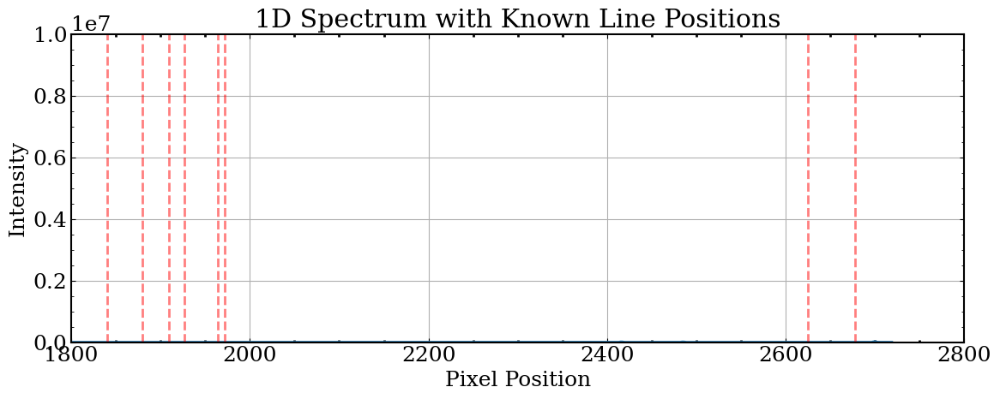

In [61]:
pixels_solution = np.array([210, 306, 435, 495, 512,540, 643,755,777,808,822,927,955,985,1005,1240,1270,1338,1422,
                            1497,1785, 1793,1840,1880,1909,1927,1964,1972,2625,2678])
wavelength_solution = np.array([3719.935, 3859.400, 4045.450,4131.830, 4158.590, 4199.860, 4348.064,4510.733,
                                4545.080, 4589.900, 4609.560,4764.890, 4806.070,4847.820,4879.900, 5227.300,
                                5269.650,5371.489,5496.210, 5606.732,6074.338,6096.1630,6163.594,6266.495,
                               6304.850,6334.428,6382.991 ,6402.246,6965.4300,7032.4127 ])#7383.980, 7514.651])
wavelength_label = np.array(["FeI", "FeI", "FeI" ,"ArII","ArI", "ArI","FeI", "ArII", "ArII", "AII","AII","AII","AII",
                             "AII","AII","AII", "AII","FeI","FeI","FeI", "AI","","","","","","",
                            "","","AI"])

plot_wavelength_pixel_solution(
    comp_spectrum_1d,
    pixels_solution,
    wavelength_solution,
    wavelength_labels=wavelength_label,
    annotate=False,
    invert_x=False,
    xlim=(1800,2800),
    ylim=(0,10e6)
)

Polynomial coefficients: [-1.51061640e-10  6.92901777e-07 -1.00672465e-03  2.00216378e+00
  3.32350241e+03]


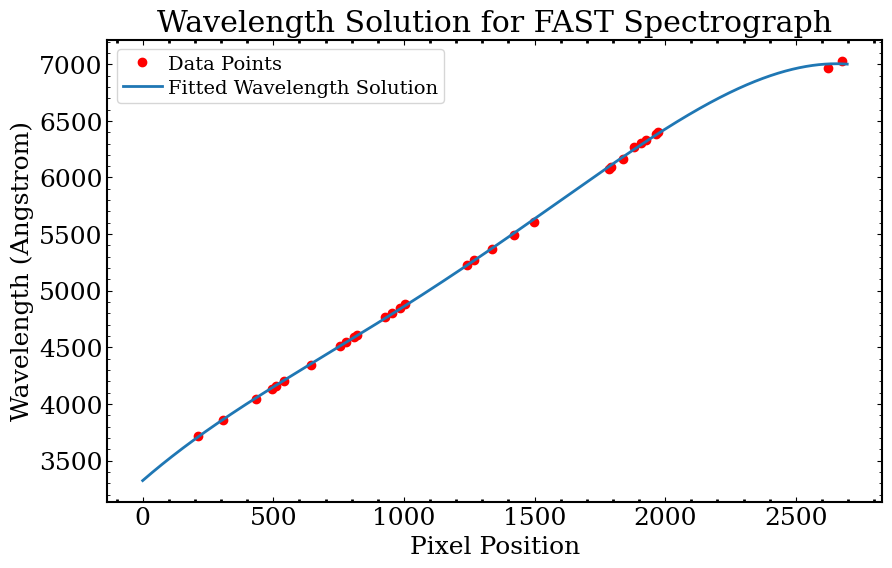

In [62]:
# Defining a polynomial function to fit the data

def polynomial(x, a, b, c, d, e):
    return  a * x**4 + b * x**3 + c * x**2 + d * x + e

# Fit the polynomial to the data
popt, pcov = curve_fit(polynomial, pixels_solution, wavelength_solution,)
a, b, c, d, e = popt

# Print out the polynomial coefficients
print("Polynomial coefficients:", popt)

# Generate wavelengths using the polynomial solution across the full pixel range
pixel_range = np.arange(0, max(pixels_solution) +20)
calibrated_wavelengths = polynomial(pixel_range, *popt)

# Plot the original data points and the fitted polynomial solution
plt.figure(figsize=(10, 6))
plt.plot(pixels_solution, wavelength_solution, 'ro', label='Data Points')
plt.plot(pixel_range, calibrated_wavelengths, label='Fitted Wavelength Solution')
plt.xlabel('Pixel Position')
plt.ylabel('Wavelength (Angstrom)')
plt.title('Wavelength Solution for FAST Spectrograph')
plt.legend()
plt.show()


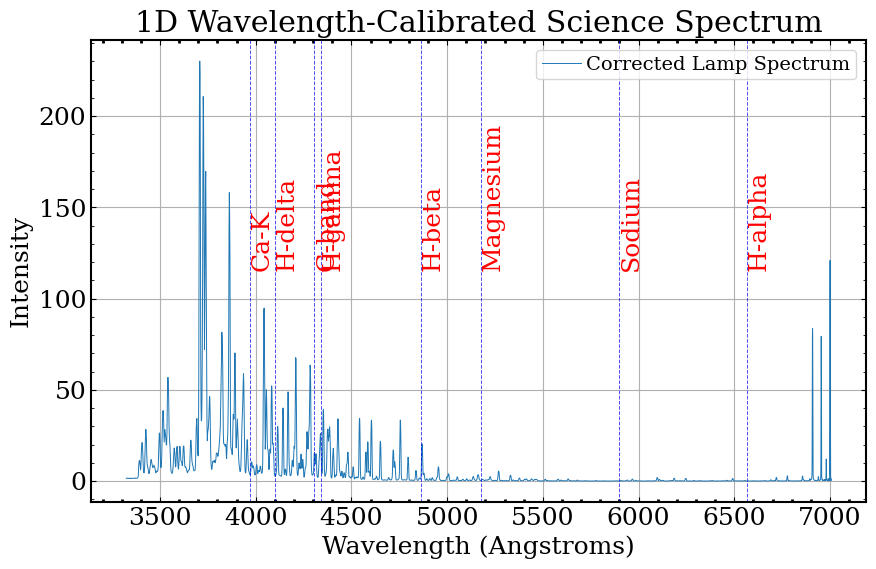

In [63]:
# defining coefficients for he polynomial function
coeffs = popt

# defining wavelength solution function
def apply_wavelength_solution(pixels, coeffs):
    return np.polyval(coeffs, pixels)

# defining data variables to apply wavelength solution to
pixels_science = np.arange(len(data_1d))
wavelengths_science = apply_wavelength_solution(pixels_science, coeffs)

# defining linear extraction data as science_spectrum_1d
science_spectrum_1d = data_1d

pixels = np.arange(len(comp_spectrum_1d))

wavelength_solution_adjusted = apply_wavelength_solution(pixels, coeffs)
wavelength_solution_adjusted_science = apply_wavelength_solution(pixels, coeffs)

# Defining spectral lines for labeling
lines = {
    'H-alpha': 6564.61,
    'H-beta': 4861,
    'H-gamma': 4340,
    'H-delta': 4101,
    'Ca-K': 3969,
    'Magnesium': 5176.7,
    'G-band':4305.61,
    'Sodium': 5895.6
}

# plotting wavelength calibrated science spectrum
def plot_1d_spectrum_with_lines(wavelengths, spectrum_1d):
    plt.figure(figsize=(10, 6))

    # Plot the 1D spectrum
    plt.plot(wavelengths, spectrum_1d, label='Corrected Lamp Spectrum', linewidth = 0.7)
    plt.xlabel('Wavelength (Angstroms)')
    plt.ylabel('Intensity')
    plt.title('1D Wavelength-Calibrated Science Spectrum')
    plt.grid(True)

    # Plot the vertical line for the H-alpha line
    for line_name, line_wavelength in lines.items():
        plt.axvline(x=line_wavelength, color='blue', linestyle='--', alpha=0.7, linewidth=0.7)
        plt.text(line_wavelength +5, np.max(spectrum_1d) * 0.5, line_name, rotation=90, verticalalignment='bottom', color='red')

    plt.legend()
    plt.show()

# Plot the 1D spectrum with only the H-alpha line using the wavelength solution
plot_1d_spectrum_with_lines(wavelength_solution_adjusted, comp_spectrum_1d)


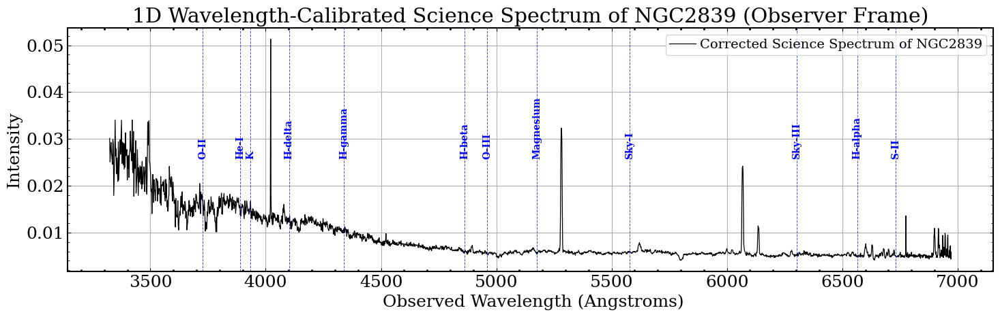

In [73]:
# plotting the wavelength calibrated 1d spectra in the observer frame

def plot_1d_spectrum_with_lines(wavelengths, spectrum_1d):
    plt.figure(figsize=(15, 5))

    # Plot the 1D spectrum
    min_len = min(len(wavelengths), len(spectrum_1d))
    wavelengths = wavelengths[:min_len]
    spectrum_1d = spectrum_1d[:min_len]
    plt.plot(wavelengths, spectrum_1d, label='Corrected Science Spectrum of NGC2839', linewidth = 0.9, color='black')
    plt.xlabel(' Observed Wavelength (Angstroms)')
    plt.ylabel('Intensity')
    plt.title('1D Wavelength-Calibrated Science Spectrum of NGC2839 (Observer Frame)')
    plt.legend()
    plt.grid(True)

    # Plot the vertical line for the H-alpha line
    for line_name, line_wavelength in lines.items():
        plt.axvline(x=line_wavelength, color='blue', linestyle='--', alpha=0.7, linewidth=0.7)
        plt.text(line_wavelength,
                 np.max(spectrum_1d) * 0.5,  # Position above the spectrum
                 line_name,
                 rotation=90,
                 ha='center',
                 va='bottom',
                 color='blue',
                 fontsize=10,
                 fontweight='bold')
    plt.tight_layout()
    plt.legend()
    plt.show()


# calling on function
plot_1d_spectrum_with_lines(wavelength_solution_adjusted_science, science_spectrum_1d)

12.680000000000291


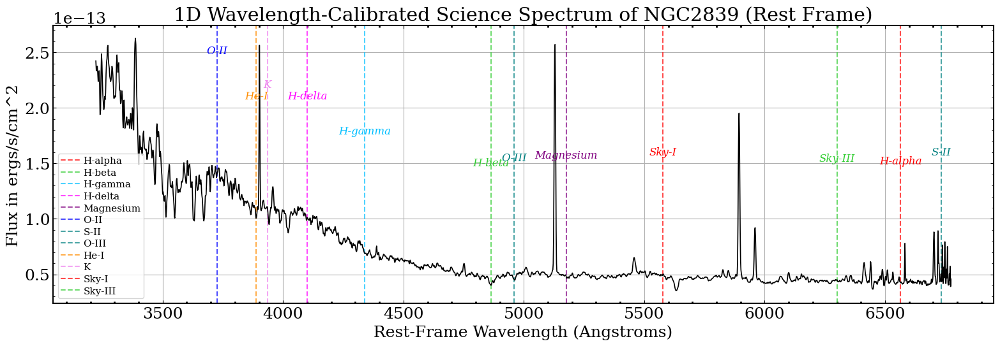

In [72]:
# plotting final extracted 1d spectra, including all spectral lines, calibrated for flux and wavelength

# Define only the H-alpha spectral line
lines = {
    'H-alpha': 6564.61,
    'H-beta':  4862.68,
    'H-gamma': 4340,
    'H-delta': 4101,
    'Magnesium': 5176.7,
    # 'G-band':4305.61,
    'O-II': 3727.092,
    'S-II': 6732.67,
    'O-III': 4960.295,
    'He-I': 3889,
    'K': 3934.777,
    'Sky-I': 5578.5,
    #'Sky-II':5894.6,
    'Sky-III':6301.7,
}

# colors for each of the spectral lines
colors = [
    'red', 'limegreen', 'deepskyblue', 'magenta',
    'purple', 'blue', 'teal', 'teal', 'darkorange', 'violet', 'red', 'limegreen', 'deepskyblue','magenta',
    'purple', 'blue'
]


# function to plot final 1d spectra
def rest_spectrum_1d(wavelengths, spectrum_1d, sigma=1):

  # redshift of the galaxy; change z variable when processing individual galaxy spectra!
  z = 0.02743 # information from https://iopscience.iop.org/article/10.1086/301103/pdf

  # defining a small manual shift to align spectral features, using the h-beta line
  hbeta_rest = 4862.68
  hbeta_observed = 4850


  # applyig the manual shift
  delta_lambda = hbeta_rest - hbeta_observed
  wavelengths_shift_corrected = wavelengths - delta_lambda
  print(delta_lambda) # printing the shifted value in angstroms

  # correcting for redshift, placing 1d spectra into rest frame
  wavelengths_rest = wavelengths_shift_corrected / (1 + z)

  # applying a gaussian smoothing
  smoothed_spectrum = gaussian_filter1d(spectrum_1d, sigma=sigma)

  # calibrating for flux
  feige34_flux = 3.4*(10**(-14)) # approximate flux of feige 34 in ergs/s/cm^2/A @ 6000 Angstroms, data from https://arxiv.org/pdf/1905.00682
  spectra_match = 0.004 # approximate intensity of target object @ 6000 Angstroms

  # applying flux ratio
  flux_ratio = feige34_flux/spectra_match
  smoothed_spectrum = smoothed_spectrum * flux_ratio

  # plotting the rest frame 1d spectra
  plt.figure(figsize=(16, 6))

  # making sure dimensions are the same!
  min_len = min(len(wavelengths_rest), len(smoothed_spectrum))
  wavelengths_rest = wavelengths_rest[:min_len]
  smoothed_spectrum = smoothed_spectrum[:min_len]

    # Ploting the vertical lines for spectral lines
  for (line_name, line_wavelength), color in zip(lines.items(), colors):
    plt.axvline(x=line_wavelength, color=color, linestyle='--', alpha=0.7, linewidth=1.5,label=line_name)

    # Find the y-value near the line_wavelength (nearest rest wavelength)
    idx1 = np.abs(wavelengths_rest - line_wavelength).argmin()
    y_val = smoothed_spectrum[idx1]

    # conditions/customization for plotting text labels
    plt.text(line_wavelength,
             y_val + 0.4 * np.max(smoothed_spectrum),  # positioning labels above the y vals
              line_name,
              rotation=0,
              color=color,
              ha='center',
              va='bottom',
              fontsize=12,
              fontstyle = 'oblique')

  # plotting everything
  plt.plot(wavelengths_rest, smoothed_spectrum, linewidth = 1.2, color = 'black')
  plt.xlabel('Rest-Frame Wavelength (Angstroms)')
  plt.ylabel('Flux in ergs/s/cm^2')
  plt.title('1D Wavelength-Calibrated Science Spectrum of NGC2839 (Rest Frame)')
  plt.legend(loc='lower left', fontsize=11)
  plt.grid(True)
  plt.tight_layout()
  plt.show()

# calling on function and plotting the 1d spectra
rest_spectrum_1d(wavelength_solution_adjusted_science, science_spectrum_1d)